In [ ]:
pip install umap-learn

In [ ]:
pip install umap

#Function section#

In [ ]:
import umap.umap_ as umap
import numpy as np
from sklearn.manifold import TSNE
import seaborn as sns

In [ ]:
def t_sne_draw(encoded_dataframe, n_components, perplexity, angle, class_):
  X_embedded = TSNE(n_components=n_components, perplexity=perplexity, angle=angle).fit_transform(encoded_dataframe)
  X, Y = X_embedded[:, 0], X_embedded[:, 1]
  sns.scatterplot(x=X, y=Y, hue=encoded_dataframe[class_], palette="deep")

In [ ]:
def umap_draw(encoded_dataframe, n_components, n_neighbors, min_dist, class_):
  reducer = umap.UMAP(n_neighbors=n_neighbors, min_dist=min_dist, n_components=n_components, metric='euclidean')
  embedding = reducer.fit_transform(encoded_dataframe)
  X_umap, Y_umap = embedding[:, 0], embedding[:, 1]
  sns.scatterplot(x=X_umap, y=Y_umap, hue=encoded_dataframe[class_], palette="deep")

#Uploading dataset with known class parameters#

In [ ]:
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import LabelEncoder
import pandas as pd
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
import matplotlib.pyplot as plt

# Reading data from csv
df_ec = pd.read_csv("ecoli.data", sep="\s+", names=["Sequence name",  "mcg", "gvh", "lip", "chg", "aac", "alm1", "alm2", "class"])

df_ec

,Sequence name,mcg,gvh,lip,chg,aac,alm1,alm2,class
0,AAT_ECOLI,0.49,0.29,0.48,0.5,0.56,0.24,0.35,cp
1,ACEA_ECOLI,0.07,0.40,0.48,0.5,0.54,0.35,0.44,cp
2,ACEK_ECOLI,0.56,0.40,0.48,0.5,0.49,0.37,0.46,cp
3,ACKA_ECOLI,0.59,0.49,0.48,0.5,0.52,0.45,0.36,cp
4,ADI_ECOLI,0.23,0.32,0.48,0.5,0.55,0.25,0.35,cp
...,...,...,...,...,...,...,...,...,...
331,TREA_ECOLI,0.74,0.56,0.48,0.5,0.47,0.68,0.30,pp
332,UGPB_ECOLI,0.71,0.57,0.48,0.5,0.48,0.35,0.32,pp
333,USHA_ECOLI,0.61,0.60,0.48,0.5,0.44,0.39,0.38,pp
334,XYLF_ECOLI,0.59,0.61,0.48,0.5,0.42,0.42,0.37,pp


In [ ]:
le = LabelEncoder()
df_ec["class"] = le.fit_transform(df_ec["class"])
df_ec

,Sequence name,mcg,gvh,lip,chg,aac,alm1,alm2,class
0,AAT_ECOLI,0.49,0.29,0.48,0.5,0.56,0.24,0.35,0
1,ACEA_ECOLI,0.07,0.40,0.48,0.5,0.54,0.35,0.44,0
2,ACEK_ECOLI,0.56,0.40,0.48,0.5,0.49,0.37,0.46,0
3,ACKA_ECOLI,0.59,0.49,0.48,0.5,0.52,0.45,0.36,0
4,ADI_ECOLI,0.23,0.32,0.48,0.5,0.55,0.25,0.35,0
...,...,...,...,...,...,...,...,...,...
331,TREA_ECOLI,0.74,0.56,0.48,0.5,0.47,0.68,0.30,7
332,UGPB_ECOLI,0.71,0.57,0.48,0.5,0.48,0.35,0.32,7
333,USHA_ECOLI,0.61,0.60,0.48,0.5,0.44,0.39,0.38,7
334,XYLF_ECOLI,0.59,0.61,0.48,0.5,0.42,0.42,0.37,7


In [ ]:
df_ec["class"].value_counts()

0    143
1     77
7     52
4     35
5     20
6      5
3      2
2      2
Name: class, dtype: int64

In [ ]:
df = df_ec.drop(columns=["Sequence name", "class"])

In [ ]:
scaler = MinMaxScaler().fit(df.to_numpy())
scaled_data = scaler.transform(df.to_numpy())
pd.DataFrame(scaled_data).describe()

,0,1,2,3,4,5,6
count,336.000000,336.000000,336.000000,336.000000,336.000000,336.000000,336.000000
mean,0.561865,0.404762,0.029762,0.002976,0.568216,0.484720,0.504780
std,0.218690,0.176377,0.170183,0.054554,0.139063,0.222424,0.211526
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.382022,0.285714,0.000000,0.000000,0.477273,0.309278,0.353535
50%,0.561798,0.369048,0.000000,0.000000,0.562500,0.438144,0.434343
75%,0.744382,0.488095,0.000000,0.000000,0.647727,0.701031,0.717172
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [ ]:
dist_matrix = linkage(scaled_data, method="complete", metric="euclidean")
dist_matrix

array([[2.80000000e+01, 5.90000000e+01, 2.46051600e-02, 2.00000000e+00],
       [1.28000000e+02, 1.39000000e+02, 4.02496151e-02, 2.00000000e+00],
       [1.48000000e+02, 1.73000000e+02, 4.33069100e-02, 2.00000000e+00],
       ...,
       [6.63000000e+02, 6.65000000e+02, 1.22023527e+00, 1.73000000e+02],
       [6.66000000e+02, 6.68000000e+02, 1.42407915e+00, 3.26000000e+02],
       [6.67000000e+02, 6.69000000e+02, 1.72919239e+00, 3.36000000e+02]])

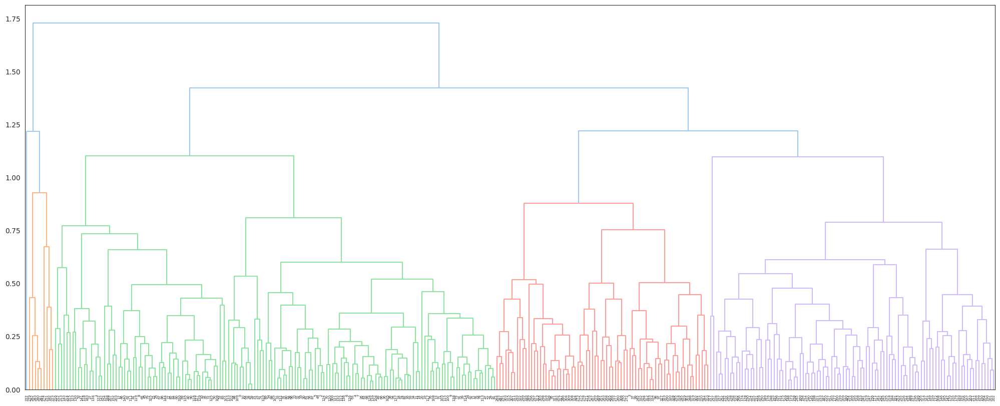

In [ ]:
# full dendogram
fig = plt.figure(figsize=(25, 10))

R = dendrogram(dist_matrix)
plt.show()

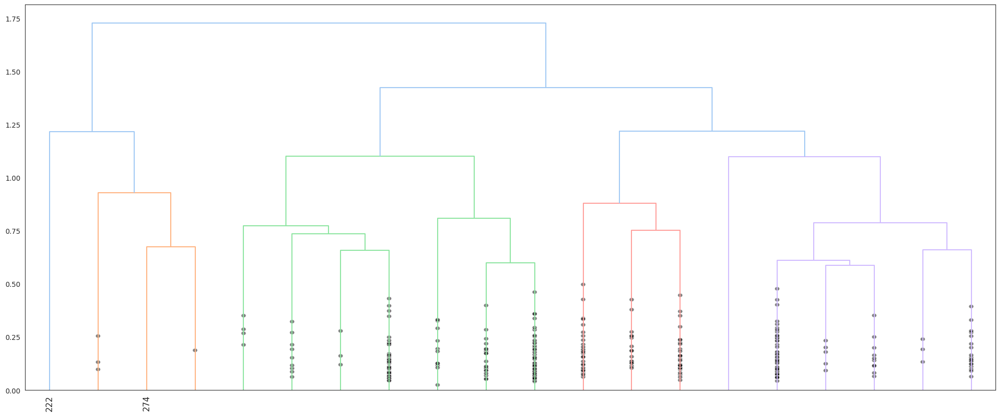

In [ ]:
# shortened dendogram
fig = plt.figure(figsize=(25, 10))

R = dendrogram(dist_matrix,
               truncate_mode='lastp',  # show only the last p merged clusters
               p=20,  # show only the last p merged clusters
               show_leaf_counts=False,  # otherwise numbers in brackets are counts
               leaf_rotation=90.,
               leaf_font_size=12.,
               show_contracted=True)
plt.show()

Maxclust criterion

In [ ]:
df["cluster_l"] = fcluster(dist_matrix, 8, criterion="maxclust")
# subtracting 1 in order to have class number from 0 to 7
df["cluster_l"] = df["cluster_l"] - 1

In [ ]:
df["cluster_l"].value_counts()

7    97
4    93
5    74
3    60
0     5
1     4
6     2
2     1
Name: cluster_l, dtype: int64

In [ ]:
from sklearn.preprocessing import LabelEncoder
df["target"] = df_ec["class"]

le = LabelEncoder()
df["target"] = le.fit_transform(df_ec["class"])
df

,mcg,gvh,lip,chg,aac,alm1,alm2,cluster_l,target
0,0.49,0.29,0.48,0.5,0.56,0.24,0.35,4,0
1,0.07,0.40,0.48,0.5,0.54,0.35,0.44,3,0
2,0.56,0.40,0.48,0.5,0.49,0.37,0.46,4,0
3,0.59,0.49,0.48,0.5,0.52,0.45,0.36,5,0
4,0.23,0.32,0.48,0.5,0.55,0.25,0.35,4,0
...,...,...,...,...,...,...,...,...,...
331,0.74,0.56,0.48,0.5,0.47,0.68,0.30,5,7
332,0.71,0.57,0.48,0.5,0.48,0.35,0.32,5,7
333,0.61,0.60,0.48,0.5,0.44,0.39,0.38,5,7
334,0.59,0.61,0.48,0.5,0.42,0.42,0.37,5,7


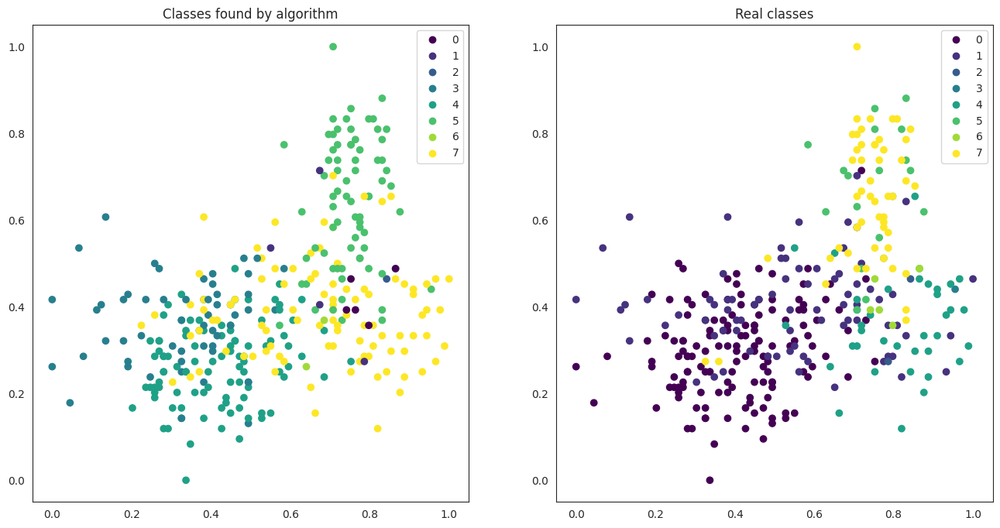

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

axes0 = axes[0].scatter(scaled_data[:, 0], scaled_data[:, 1], c=df["cluster_l"], cmap="viridis")
axes1 = axes[1].scatter(scaled_data[:, 0], scaled_data[:, 1], c=df["target"], cmap="viridis")

axes[0].set_title("Classes found by algorithm")
axes[1].set_title("Real classes")


axes[0].legend(*axes0.legend_elements())
axes[1].legend(*axes1.legend_elements())

In [ ]:
cl = pd.DataFrame(np.unique(df["cluster_l"].values))
cl["Amount"] = np.unique(df["cluster_l"].values, return_counts=True)[1]
cl = cl.rename(columns={0: "class"})
cl

,class,Amount
0,0,5
1,1,4
2,2,1
3,3,60
4,4,93
5,5,74
6,6,2
7,7,97


In [ ]:
tr = pd.DataFrame(np.unique(df["target"].values))
tr["Amount"] = np.unique(df["target"].values, return_counts=True)[1]
tr = tr.rename(columns={0: "class"})
tr

,class,Amount
0,0,143
1,1,77
2,2,2
3,3,2
4,4,35
5,5,20
6,6,5
7,7,52


#Agglomerative algorithm with known class parameters#

In [ ]:
from sklearn.cluster import AgglomerativeClustering
df

,mcg,gvh,lip,chg,aac,alm1,alm2,cluster_l,target
0,0.49,0.29,0.48,0.5,0.56,0.24,0.35,4,0
1,0.07,0.40,0.48,0.5,0.54,0.35,0.44,3,0
2,0.56,0.40,0.48,0.5,0.49,0.37,0.46,4,0
3,0.59,0.49,0.48,0.5,0.52,0.45,0.36,5,0
4,0.23,0.32,0.48,0.5,0.55,0.25,0.35,4,0
...,...,...,...,...,...,...,...,...,...
331,0.74,0.56,0.48,0.5,0.47,0.68,0.30,5,7
332,0.71,0.57,0.48,0.5,0.48,0.35,0.32,5,7
333,0.61,0.60,0.48,0.5,0.44,0.39,0.38,5,7
334,0.59,0.61,0.48,0.5,0.42,0.42,0.37,5,7


In [ ]:
df.drop(columns=["cluster_l"], inplace=True)
df

,mcg,gvh,lip,chg,aac,alm1,alm2,target
0,0.49,0.29,0.48,0.5,0.56,0.24,0.35,0
1,0.07,0.40,0.48,0.5,0.54,0.35,0.44,0
2,0.56,0.40,0.48,0.5,0.49,0.37,0.46,0
3,0.59,0.49,0.48,0.5,0.52,0.45,0.36,0
4,0.23,0.32,0.48,0.5,0.55,0.25,0.35,0
...,...,...,...,...,...,...,...,...
331,0.74,0.56,0.48,0.5,0.47,0.68,0.30,7
332,0.71,0.57,0.48,0.5,0.48,0.35,0.32,7
333,0.61,0.60,0.48,0.5,0.44,0.39,0.38,7
334,0.59,0.61,0.48,0.5,0.42,0.42,0.37,7


SKlearn algorithm

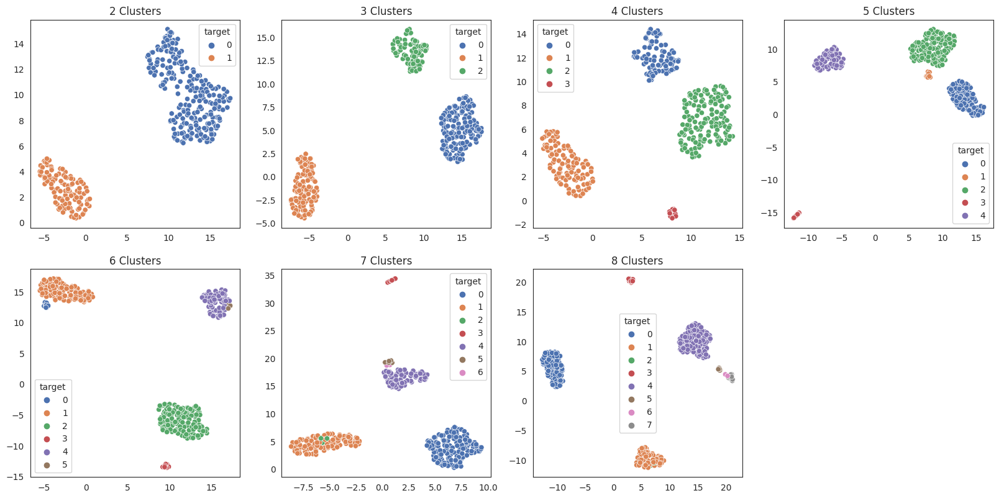

In [ ]:
plt.figure(figsize = (20, 20))
silhouette_scores = []

for i in range(2, 9):
  # df.drop(columns=["cluster_l"], inplace=True)
  df_ = df.copy()

  clust = AgglomerativeClustering(n_clusters=i, linkage="complete", compute_full_tree="auto").fit(df_.drop("target", axis=1))
  labels = clust.labels_

  if i != 9:
    df_["target"] = labels

  plt.subplot(4, 4, i-1)
  umap_draw(df_, 2, 15, 0.6, "target")

  if i == 9:
    plt.title(f"Original")
  else:
    silhouette_avg = silhouette_score(df_.drop("target", axis=1), labels)
    silhouette_scores.append(silhouette_avg)

    plt.title(f"{i} Clusters")

Getting Silhouette score

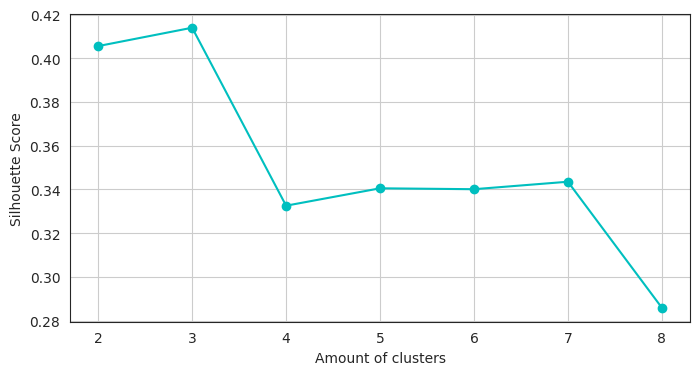

In [ ]:
fig, axes = plt.subplots(1, 1, figsize=(8, 4))

axes0 = axes.plot(list(range(2, 9)), silhouette_scores, color="c", marker="o")

axes.set_xlabel('Amount of clusters')
axes.set_ylabel('Silhouette Score')
axes.grid()

Adjusted Rand Index (ARI)

In [ ]:
labels = fcluster(dist_matrix, 8, criterion="maxclust")
ground_truth_labels = df_ec["class"]
pred_labels = labels - 1
ari_score = adjusted_rand_score(ground_truth_labels, pred_labels)
print("ARI score:", ari_score)

ARI score: 0.5027386658014871


Fowlkes-Mallows Index (FMI)

In [ ]:
from sklearn.metrics import fowlkes_mallows_score
fmi_score = fowlkes_mallows_score(ground_truth_labels, pred_labels)
print("FMI score:", fmi_score)

FMI score: 0.6299223352851651


Scipy algorithm

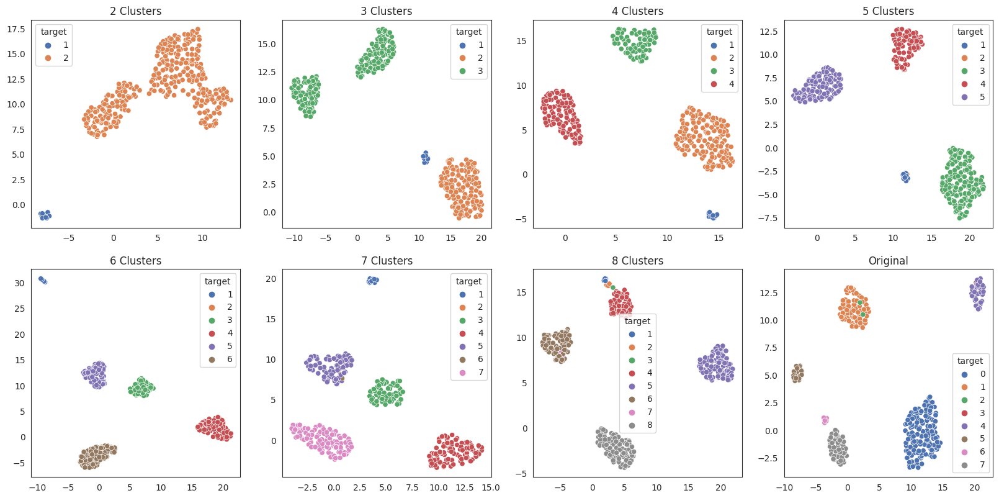

In [ ]:
plt.figure(figsize = (20, 20))

for i in range(2, 10):

  threshold = i

# Получите метки классов
  labels = fcluster(dist_matrix, threshold, criterion="maxclust")
  # df.drop(columns=["cluster_l"], inplace=True)
  df__ = df.copy()


  if i != 9:
    df__["target"] = labels

  plt.subplot(4, 4, i-1)
  umap_draw(df__, 2, 15, 0.6, "target")

  if i == 9:
    plt.title(f"Original")
  else:
    plt.title(f"{i} Clusters")

Getting Silhouette Score

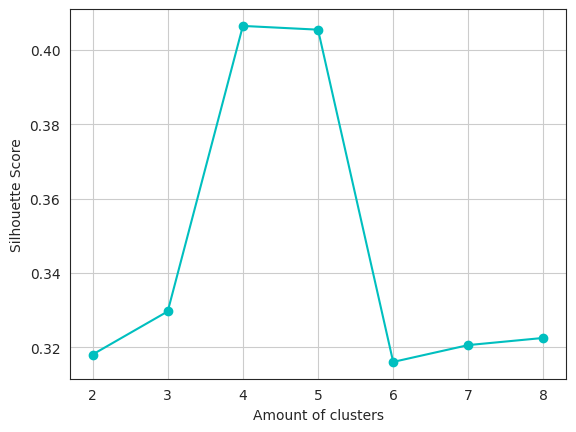

In [ ]:
silhouette_scores = []

for i in range(2, 9):
  threshold = i
  labels = fcluster(dist_matrix, threshold, criterion="maxclust")

  df_ = df.copy()
  df_["target"] = labels

  silhouette_avg = silhouette_score(df_.drop("target", axis=1), labels)
  silhouette_scores.append(silhouette_avg)

plt.figure()
plt.plot(list(range(2, 9)), silhouette_scores, color="c", marker="o")

plt.xlabel('Amount of clusters')
plt.ylabel('Silhouette Score')

plt.grid()

plt.show()

Adjusted Rand Index (ARI)

In [ ]:
labels = fcluster(dist_matrix, 8, criterion="maxclust")
ground_truth_labels = df_ec["class"]
pred_labels = labels - 1
ari_score = adjusted_rand_score(ground_truth_labels, pred_labels)
print("ARI score:", ari_score)

ARI score: 0.5027386658014871


Fowlkes-Mallows Index (FMI)

In [ ]:
fmi_score = fowlkes_mallows_score(ground_truth_labels, pred_labels)
print("FMI score:", fmi_score)

FMI score: 0.6299223352851651


#KMeans algorithm with known class parameters#


In [ ]:
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from scipy.spatial.distance import cdist
from sklearn.metrics import adjusted_rand_score

In [ ]:
df

,mcg,gvh,lip,chg,aac,alm1,alm2,target
0,0.49,0.29,0.48,0.5,0.56,0.24,0.35,0
1,0.07,0.40,0.48,0.5,0.54,0.35,0.44,0
2,0.56,0.40,0.48,0.5,0.49,0.37,0.46,0
3,0.59,0.49,0.48,0.5,0.52,0.45,0.36,0
4,0.23,0.32,0.48,0.5,0.55,0.25,0.35,0
...,...,...,...,...,...,...,...,...
331,0.74,0.56,0.48,0.5,0.47,0.68,0.30,7
332,0.71,0.57,0.48,0.5,0.48,0.35,0.32,7
333,0.61,0.60,0.48,0.5,0.44,0.39,0.38,7
334,0.59,0.61,0.48,0.5,0.42,0.42,0.37,7


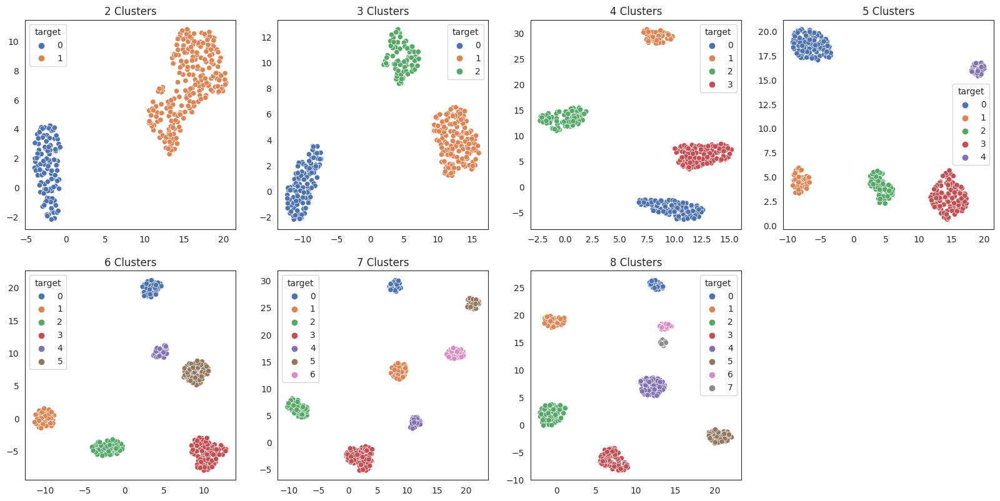

In [ ]:
plt.figure(figsize = (20, 20))

silhouette_scores = []
distortions = []

for i in range(2, 9):
  # threshold = i

  # labels = fcluster(dist_matrix, threshold, criterion="maxclust")

  df_ = df.copy()

  kmeans = KMeans(n_clusters=i, random_state=0, n_init="auto").fit(df_.drop("target", axis=1))
  labels = kmeans.labels_

  if i != 9:
    df_["target"] = labels

  plt.subplot(4, 4, i-1)
  umap_draw(df_, 2, 15, 0.6, "target")

  if i == 9:
    plt.title(f"Original")
  else:
    silhouette_avg = silhouette_score(df_.drop("target", axis=1), labels)
    silhouette_scores.append(silhouette_avg)

    distortion = sum(np.min(cdist(df_.drop("target", axis=1), kmeans.cluster_centers_, 'euclidean'), axis=1)) / df_.drop("target", axis=1).shape[0]
    distortions.append(distortion)

    plt.title(f"{i} Clusters")

Elbow and Silhouette scores

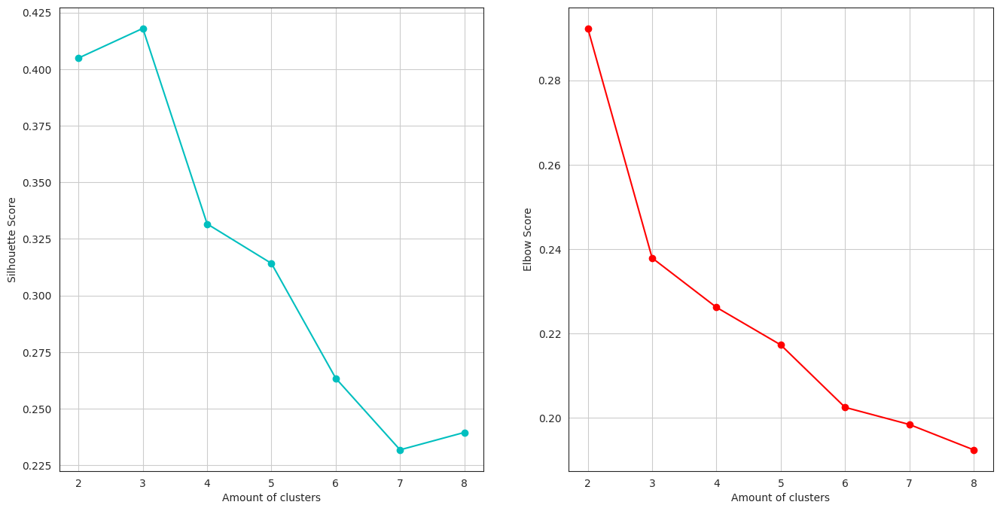

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

axes0 = axes[0].plot(list(range(2, 9)), silhouette_scores, color="c", marker="o")
axes1 = axes[1].plot(list(range(2, 9)), distortions, color="r", marker="o")

axes[0].set_xlabel('Amount of clusters')
axes[0].set_ylabel('Silhouette Score')
axes[0].grid()


axes[1].set_xlabel('Amount of clusters')
axes[1].set_ylabel('Elbow Score')
axes[1].grid()

Adjusted Rand Index (ARI)

In [ ]:
kmeans = KMeans(n_clusters=i, random_state=0, n_init="auto").fit(df_.drop("target", axis=1))
labels = kmeans.labels_
ground_truth_labels = df_ec["class"]
pred_labels = labels - 1
ari_score = adjusted_rand_score(ground_truth_labels, pred_labels)
print("ARI score:", ari_score)

ARI score: 0.3822217280626179


Fowlkes-Mallows Index (FMI)

In [ ]:
fmi_score = fowlkes_mallows_score(ground_truth_labels, pred_labels)
print("FMI score:", fmi_score)

FMI score: 0.5234505563371472


#Uploading dataset with unknown class parameters#

In [ ]:
# Reading data from csv
df_mark = pd.read_csv("marketing_campaign.csv", sep="\t")
df_mark

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,...,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,...,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,...,5,0,0,0,0,0,0,3,11,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,10870,1967,Graduation,Married,61223.0,0,1,13-06-2013,46,709,...,5,0,0,0,0,0,0,3,11,0
2236,4001,1946,PhD,Together,64014.0,2,1,10-06-2014,56,406,...,7,0,0,0,1,0,0,3,11,0
2237,7270,1981,Graduation,Divorced,56981.0,0,0,25-01-2014,91,908,...,6,0,1,0,0,0,0,3,11,0
2238,8235,1956,Master,Together,69245.0,0,1,24-01-2014,8,428,...,3,0,0,0,0,0,0,3,11,0


In [ ]:
df_mark.columns

Index(['ID', 'Year_Birth', 'Education', 'Marital_Status', 'Income', 'Kidhome',
       'Teenhome', 'Dt_Customer', 'Recency', 'MntWines', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Complain', 'Z_CostContact', 'Z_Revenue', 'Response'],
      dtype='object')

In [ ]:
df_mark_new = df_mark.drop(columns=["ID", "Year_Birth", "Education", "Marital_Status", "Dt_Customer"], axis=1)
df_mark_new

,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,58138.0,0,0,58,635,88,546,172,88,88,...,7,0,0,0,0,0,0,3,11,1
1,46344.0,1,1,38,11,1,6,2,1,6,...,5,0,0,0,0,0,0,3,11,0
2,71613.0,0,0,26,426,49,127,111,21,42,...,4,0,0,0,0,0,0,3,11,0
3,26646.0,1,0,26,11,4,20,10,3,5,...,6,0,0,0,0,0,0,3,11,0
4,58293.0,1,0,94,173,43,118,46,27,15,...,5,0,0,0,0,0,0,3,11,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,61223.0,0,1,46,709,43,182,42,118,247,...,5,0,0,0,0,0,0,3,11,0
2236,64014.0,2,1,56,406,0,30,0,0,8,...,7,0,0,0,1,0,0,3,11,0
2237,56981.0,0,0,91,908,48,217,32,12,24,...,6,0,1,0,0,0,0,3,11,0
2238,69245.0,0,1,8,428,30,214,80,30,61,...,3,0,0,0,0,0,0,3,11,0


In [ ]:
df_mark_new.drop(columns=["Income"], axis=1, inplace=True)
df_mark_new

,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,0,0,58,635,88,546,172,88,88,3,...,7,0,0,0,0,0,0,3,11,1
1,1,1,38,11,1,6,2,1,6,2,...,5,0,0,0,0,0,0,3,11,0
2,0,0,26,426,49,127,111,21,42,1,...,4,0,0,0,0,0,0,3,11,0
3,1,0,26,11,4,20,10,3,5,2,...,6,0,0,0,0,0,0,3,11,0
4,1,0,94,173,43,118,46,27,15,5,...,5,0,0,0,0,0,0,3,11,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,0,1,46,709,43,182,42,118,247,2,...,5,0,0,0,0,0,0,3,11,0
2236,2,1,56,406,0,30,0,0,8,7,...,7,0,0,0,1,0,0,3,11,0
2237,0,0,91,908,48,217,32,12,24,1,...,6,0,1,0,0,0,0,3,11,0
2238,0,1,8,428,30,214,80,30,61,2,...,3,0,0,0,0,0,0,3,11,0


In [ ]:
scaler = MinMaxScaler().fit(df_mark_new.to_numpy())
scaled_data = scaler.transform(df_mark_new.to_numpy())
pd.DataFrame(scaled_data).head()

,0,1,2,3,4,5,6,7,8,9,...,13,14,15,16,17,18,19,20,21,22
0,0.0,0.0,0.585859,0.425318,0.442211,0.316522,0.664093,0.334601,0.243094,0.200000,...,0.35,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,0.5,0.5,0.383838,0.007368,0.005025,0.003478,0.007722,0.003802,0.016575,0.133333,...,0.25,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.262626,0.285332,0.246231,0.073623,0.428571,0.079848,0.116022,0.066667,...,0.20,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.5,0.0,0.262626,0.007368,0.020101,0.011594,0.038610,0.011407,0.013812,0.133333,...,0.30,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.5,0.0,0.949495,0.115874,0.216080,0.068406,0.177606,0.102662,0.041436,0.333333,...,0.25,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
scaled_data[0, :].shape

(23,)

In [ ]:
dist_matrix = linkage(scaled_data, method="complete", metric="euclidean")
dist_matrix

array([[1.03200000e+03, 1.45500000e+03, 0.00000000e+00, 2.00000000e+00],
       [8.00000000e+01, 1.77600000e+03, 0.00000000e+00, 2.00000000e+00],
       [1.23300000e+03, 2.21600000e+03, 0.00000000e+00, 2.00000000e+00],
       ...,
       [4.47200000e+03, 4.47400000e+03, 2.93778873e+00, 2.44000000e+02],
       [4.47300000e+03, 4.47500000e+03, 3.03834261e+00, 1.99600000e+03],
       [4.47600000e+03, 4.47700000e+03, 3.17097766e+00, 2.24000000e+03]])

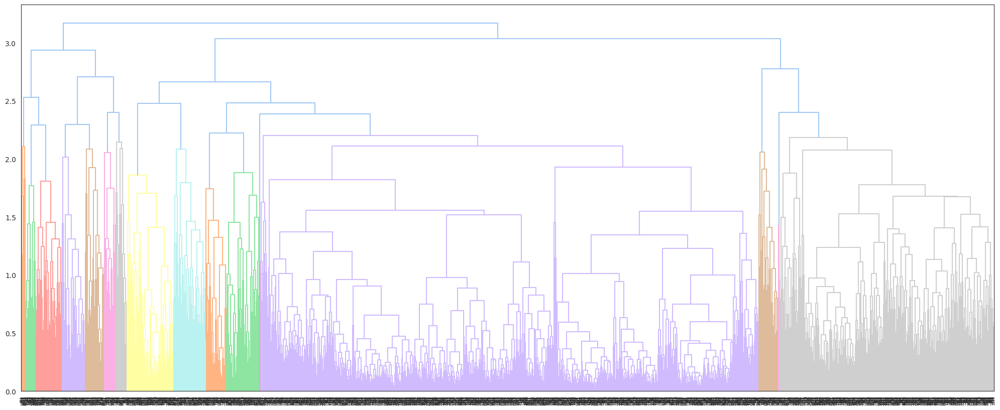

In [ ]:
fig = plt.figure(figsize=(25, 10))

R = dendrogram(dist_matrix)
plt.show()

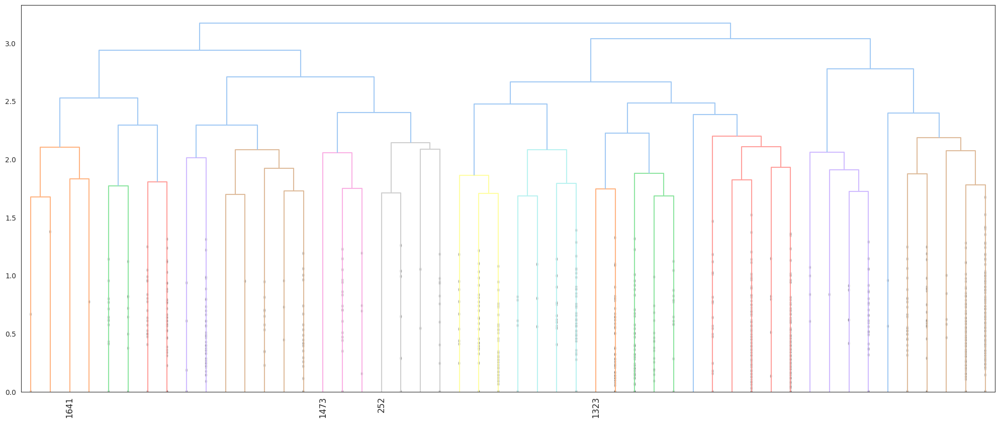

In [ ]:
fig = plt.figure(figsize=(25, 10))

R = dendrogram(dist_matrix,
               truncate_mode='lastp',  # show only the last p merged clusters
               p=50,  # show only the last p merged clusters
               show_leaf_counts=False,  # otherwise numbers in brackets are counts
               leaf_rotation=90.,
               leaf_font_size=12.,
               show_contracted=True)
plt.show()

Maxclust criterion

In [ ]:
df_mark_new["cluster_l"] = fcluster(dist_matrix, 36, criterion="maxclust")

In [ ]:
df_mark_new["cluster_l"].value_counts()

26    654
28    465
36    436
17     96
19     62
5      59
20     48
7      47
21     43
31     36
22     33
33     29
10     27
11     25
4      24
34     21
24     19
15     13
9      12
18     12
16     11
13      9
35      7
6       7
1       7
27      7
29      6
8       5
14      4
32      4
2       3
30      3
23      2
25      2
12      1
3       1
Name: cluster_l, dtype: int64

In [ ]:
df_mark_new

,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,...,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,cluster_l
0,0,0,58,635,88,546,172,88,88,3,...,0,0,0,0,0,0,3,11,1,19
1,1,1,38,11,1,6,2,1,6,2,...,0,0,0,0,0,0,3,11,0,26
2,0,0,26,426,49,127,111,21,42,1,...,0,0,0,0,0,0,3,11,0,36
3,1,0,26,11,4,20,10,3,5,2,...,0,0,0,0,0,0,3,11,0,28
4,1,0,94,173,43,118,46,27,15,5,...,0,0,0,0,0,0,3,11,0,28
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,0,1,46,709,43,182,42,118,247,2,...,0,0,0,0,0,0,3,11,0,36
2236,2,1,56,406,0,30,0,0,8,7,...,0,0,0,1,0,0,3,11,0,28
2237,0,0,91,908,48,217,32,12,24,1,...,0,1,0,0,0,0,3,11,0,7
2238,0,1,8,428,30,214,80,30,61,2,...,0,0,0,0,0,0,3,11,0,36


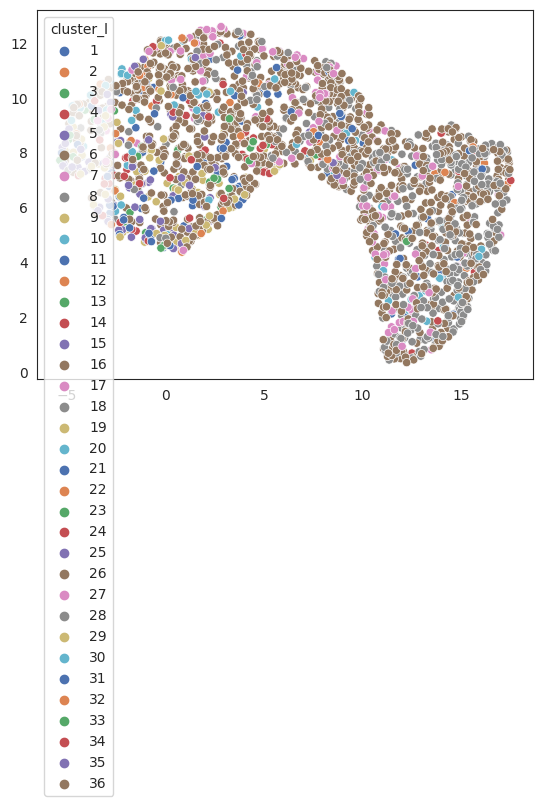

In [ ]:
umap_draw(df_mark_new, 2, 50, 0.6, "cluster_l")

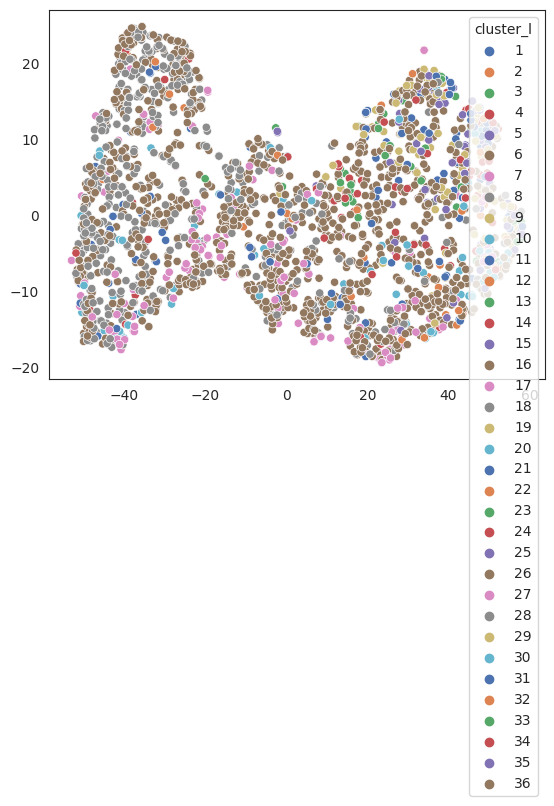

In [ ]:
t_sne_draw(df_mark_new, 2, 50, 0.6, "cluster_l")

#Agglomerative algorithm with unknown class parameters#

In [ ]:
df_mark_new

,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,...,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,cluster_l
0,0,0,58,635,88,546,172,88,88,3,...,0,0,0,0,0,0,3,11,1,19
1,1,1,38,11,1,6,2,1,6,2,...,0,0,0,0,0,0,3,11,0,26
2,0,0,26,426,49,127,111,21,42,1,...,0,0,0,0,0,0,3,11,0,36
3,1,0,26,11,4,20,10,3,5,2,...,0,0,0,0,0,0,3,11,0,28
4,1,0,94,173,43,118,46,27,15,5,...,0,0,0,0,0,0,3,11,0,28
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,0,1,46,709,43,182,42,118,247,2,...,0,0,0,0,0,0,3,11,0,36
2236,2,1,56,406,0,30,0,0,8,7,...,0,0,0,1,0,0,3,11,0,28
2237,0,0,91,908,48,217,32,12,24,1,...,0,1,0,0,0,0,3,11,0,7
2238,0,1,8,428,30,214,80,30,61,2,...,0,0,0,0,0,0,3,11,0,36


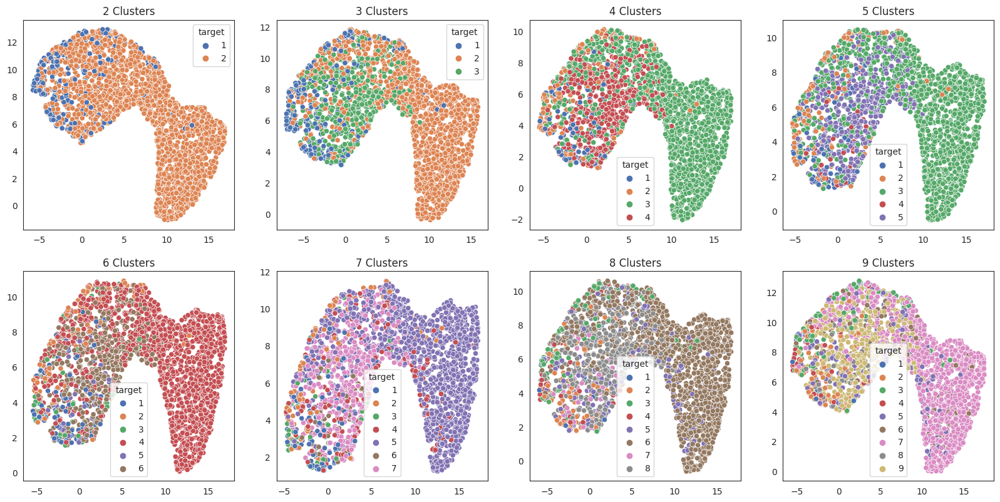

In [ ]:
plt.figure(figsize = (20, 20))

for i in range(2, 10):

  threshold = i

  labels = fcluster(dist_matrix, threshold, criterion="maxclust")

  # df_mark_new.drop(columns=["cluster_l"])
  df_ = df_mark_new.drop(columns=["cluster_l"]).copy()
  df_["target"] = labels

  plt.subplot(4, 4, i-1)
  umap_draw(df_, 2, 40, 0.6, "target")

  plt.title(f"{i} Clusters")

Getting Silhouette Score

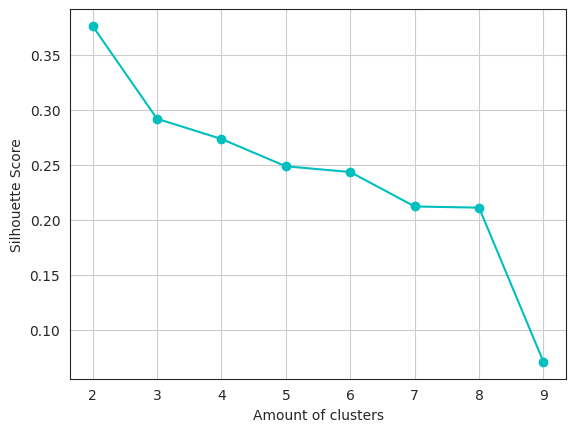

In [ ]:
silhouette_scores = []

for i in range(2, 10):
  threshold = i

  labels = fcluster(dist_matrix, threshold, criterion="maxclust")

  df_ = df_mark_new.drop(columns=["cluster_l"]).copy()
  df_["target"] = labels

  silhouette_avg = silhouette_score(df_.drop("target", axis=1), labels)
  silhouette_scores.append(silhouette_avg)

plt.figure()
plt.plot(list(range(2, 10)), silhouette_scores, color="c", marker="o")
plt.xlabel('Amount of clusters')
plt.ylabel('Silhouette Score')
plt.grid()

#KMeans algorithm for dataset with unknown class parameters#

In [ ]:
df_mark_new

,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,...,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,cluster_l
0,0,0,58,635,88,546,172,88,88,3,...,0,0,0,0,0,0,3,11,1,19
1,1,1,38,11,1,6,2,1,6,2,...,0,0,0,0,0,0,3,11,0,26
2,0,0,26,426,49,127,111,21,42,1,...,0,0,0,0,0,0,3,11,0,36
3,1,0,26,11,4,20,10,3,5,2,...,0,0,0,0,0,0,3,11,0,28
4,1,0,94,173,43,118,46,27,15,5,...,0,0,0,0,0,0,3,11,0,28
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,0,1,46,709,43,182,42,118,247,2,...,0,0,0,0,0,0,3,11,0,36
2236,2,1,56,406,0,30,0,0,8,7,...,0,0,0,1,0,0,3,11,0,28
2237,0,0,91,908,48,217,32,12,24,1,...,0,1,0,0,0,0,3,11,0,7
2238,0,1,8,428,30,214,80,30,61,2,...,0,0,0,0,0,0,3,11,0,36


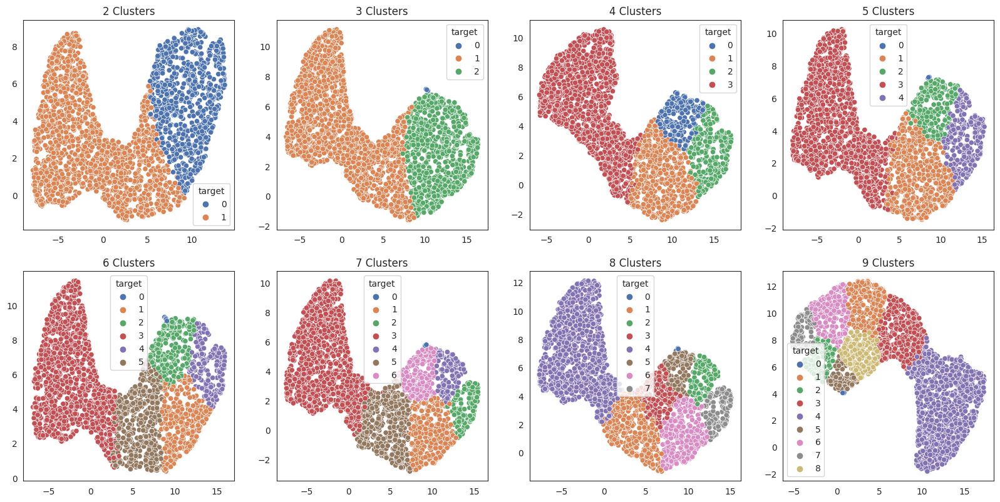

In [ ]:
plt.figure(figsize = (20, 20))

silhouette_scores = []
distortions = []

for i in range(2, 10):
  threshold = i

  labels = fcluster(dist_matrix, threshold, criterion="maxclust")

  df_ = df_mark_new.copy()

  kmeans = KMeans(n_clusters=i, random_state=0, n_init="auto").fit(df_.drop("cluster_l", axis=1))
  labels = kmeans.labels_


  df_["target"] = labels

  plt.subplot(4, 4, i-1)
  umap_draw(df_, 2, 40, 0.6, "target")


  silhouette_avg = silhouette_score(df_.drop("target", axis=1), labels)
  silhouette_scores.append(silhouette_avg)

  plt.title(f"{i} Clusters")

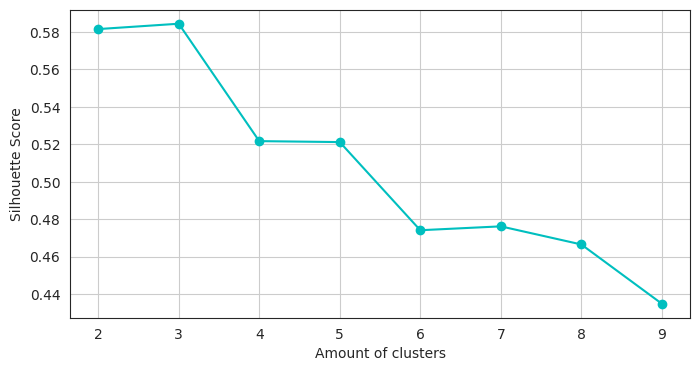

In [ ]:
fig, axes = plt.subplots(1, 1, figsize=(8, 4))

axes0 = axes.plot(list(range(2, 10)), silhouette_scores, color="c", marker="o")

axes.set_xlabel('Amount of clusters')
axes.set_ylabel('Silhouette Score')

axes.grid()

#Exploratory analysis#

In [ ]:
df_og = pd.read_csv("ecoli.data", sep="\s+", names=["Sequence name",  "mcg", "gvh", "lip", "chg", "aac", "alm1", "alm2", "class"])

df_og

,Sequence name,mcg,gvh,lip,chg,aac,alm1,alm2,class
0,AAT_ECOLI,0.49,0.29,0.48,0.5,0.56,0.24,0.35,cp
1,ACEA_ECOLI,0.07,0.40,0.48,0.5,0.54,0.35,0.44,cp
2,ACEK_ECOLI,0.56,0.40,0.48,0.5,0.49,0.37,0.46,cp
3,ACKA_ECOLI,0.59,0.49,0.48,0.5,0.52,0.45,0.36,cp
4,ADI_ECOLI,0.23,0.32,0.48,0.5,0.55,0.25,0.35,cp
...,...,...,...,...,...,...,...,...,...
331,TREA_ECOLI,0.74,0.56,0.48,0.5,0.47,0.68,0.30,pp
332,UGPB_ECOLI,0.71,0.57,0.48,0.5,0.48,0.35,0.32,pp
333,USHA_ECOLI,0.61,0.60,0.48,0.5,0.44,0.39,0.38,pp
334,XYLF_ECOLI,0.59,0.61,0.48,0.5,0.42,0.42,0.37,pp


In [ ]:
df_og["class"].value_counts()

cp     143
im      77
pp      52
imU     35
om      20
omL      5
imS      2
imL      2
Name: class, dtype: int64

In [ ]:
num_cols = list(df_og.select_dtypes(["int64", "float64"]))
num_cols

['mcg', 'gvh', 'lip', 'chg', 'aac', 'alm1', 'alm2']

In [ ]:
sorted(list(df_og["class"].unique()))

['cp', 'im', 'imL', 'imS', 'imU', 'om', 'omL', 'pp']

Plotting pie chart that shows the amount of each class in %

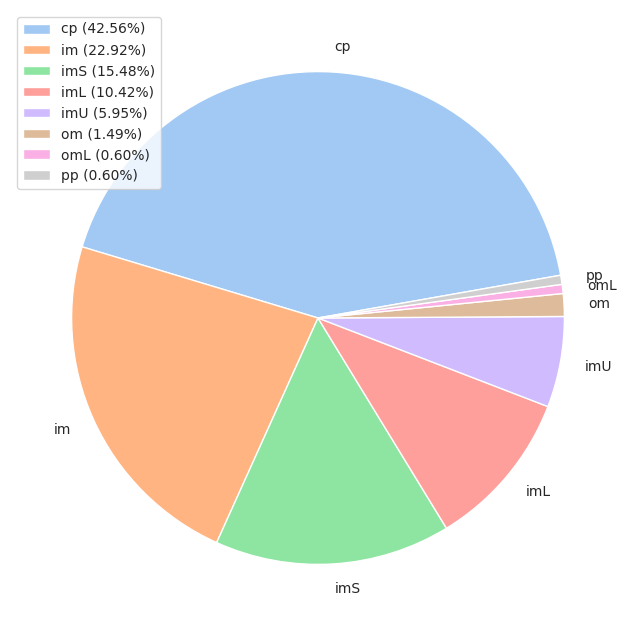

In [ ]:
attr_count = list(df_og["class"].value_counts())
attr_labels = list(df_og["class"].unique())

percentages = [f'{count / sum(attr_count) * 100:.2f}%' for count in attr_count]  # % list
legend_labels = [f'{label} ({percentage})' for label, percentage in zip(attr_labels, percentages)]  # adding % into legend

sns.set_palette("pastel")
fig, ax = plt.subplots(figsize=(8, 8))

ax.pie(attr_count, labels=attr_labels, startangle=10)
ax.legend(legend_labels)

plt.show()

In [ ]:
num_stat = df_og[num_cols].describe().transpose().reset_index()
num_stat.rename(columns={"index": "Parameter"}, inplace=True)
num_stat

,Parameter,count,mean,std,min,25%,50%,75%,max
0,mcg,336.0,0.500060,0.194634,0.00,0.34,0.500,0.6625,0.89
1,gvh,336.0,0.500000,0.148157,0.16,0.40,0.470,0.5700,1.00
2,lip,336.0,0.495476,0.088495,0.48,0.48,0.480,0.4800,1.00
3,chg,336.0,0.501488,0.027277,0.50,0.50,0.500,0.5000,1.00
4,aac,336.0,0.500030,0.122376,0.00,0.42,0.495,0.5700,0.88
5,alm1,336.0,0.500179,0.215751,0.03,0.33,0.455,0.7100,1.00
6,alm2,336.0,0.499732,0.209411,0.00,0.35,0.430,0.7100,0.99


Plotting distribution density

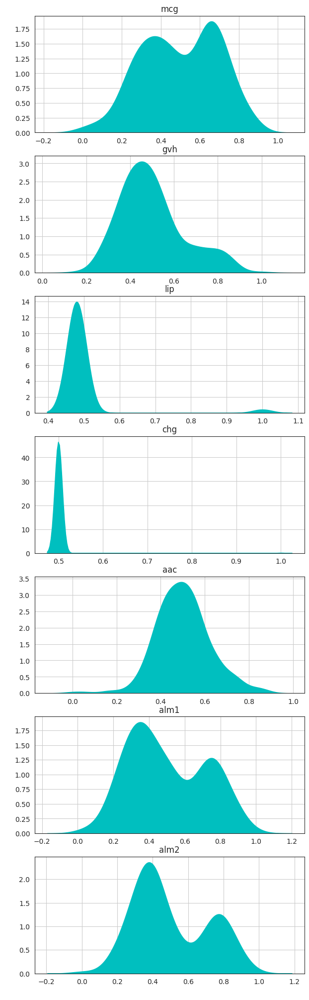

In [ ]:
fig, ax = plt.subplots(ncols=1, nrows=7, figsize=(7, 25))
i = 0

for col in num_cols:
  sns.kdeplot(x=df_og[col], fill=True, alpha=1, ax=ax[i], color="c")

  ax[i].set_xlabel(" ")
  ax[i].set_ylabel(" ")
  ax[i].set_title(col)
  ax[i].grid()
  i += 1
plt.show()

Plotting histograms

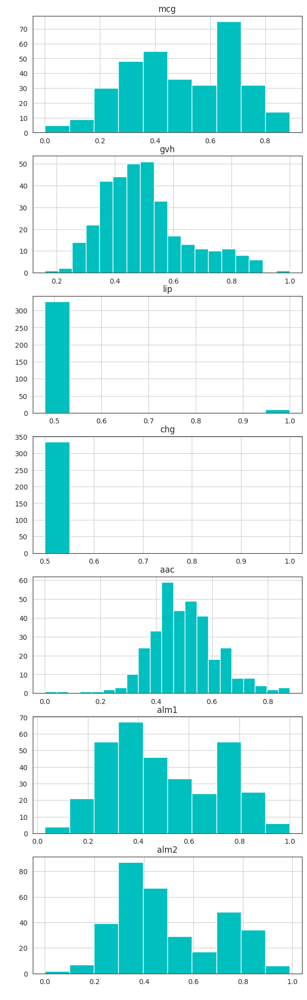

In [ ]:
fig, ax = plt.subplots(ncols=1, nrows=7, figsize=(7, 25))
i = 0

for col in num_cols:
  sns.histplot(x=df_og[col], fill=True, alpha=1, ax=ax[i], color="c")

  ax[i].set_xlabel(" ")
  ax[i].set_ylabel(" ")
  ax[i].set_title(col)
  ax[i].grid()
  i += 1
plt.show()

Checking assymetry of distribution

In [ ]:
skew = []

for col in num_cols:
  skew.append(round(df_og[col].skew(), 3))

num_skew = pd.DataFrame({"Parameter": num_cols, "skewness": skew})
num_skew

,Parameter,skewness
0,mcg,-0.166
1,gvh,0.775
2,lip,5.559
3,chg,18.330
4,aac,0.063
5,alm1,0.263
6,alm2,0.414


Making a list of parameters with normal distribution

In [ ]:
gauss_feat = list(num_skew.query("skewness < 0.05 & skewness > -0.05")["Parameter"])
gauss_feat

[]

Plotting heatmap based on correlation matrix

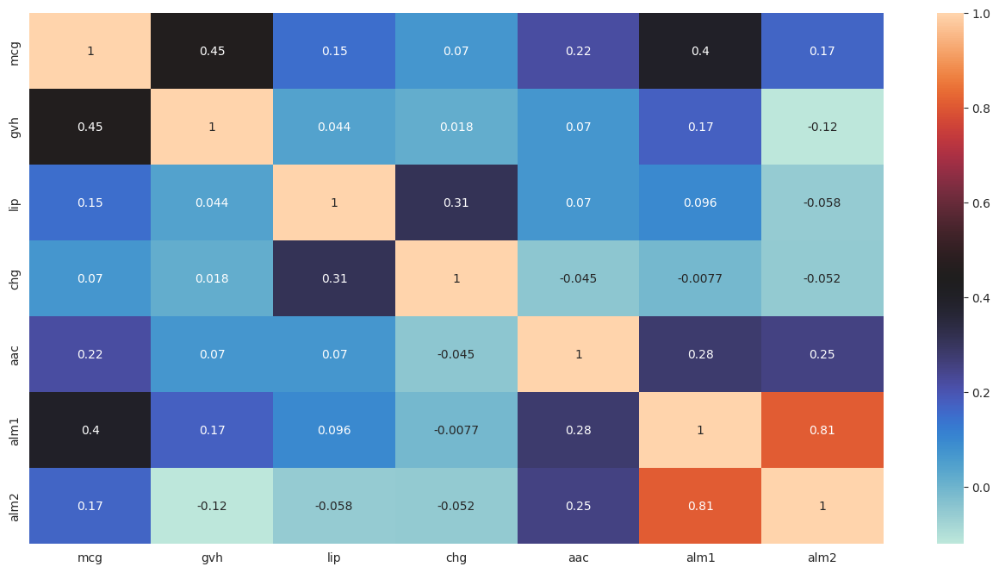

In [ ]:
corr = df_og[num_cols].corr()
plt.figure(figsize=(16, 8))
sns.heatmap(corr, cmap="icefire", annot=True)
plt.show()

Plotting heatmap based on correlation matrix without exessive information

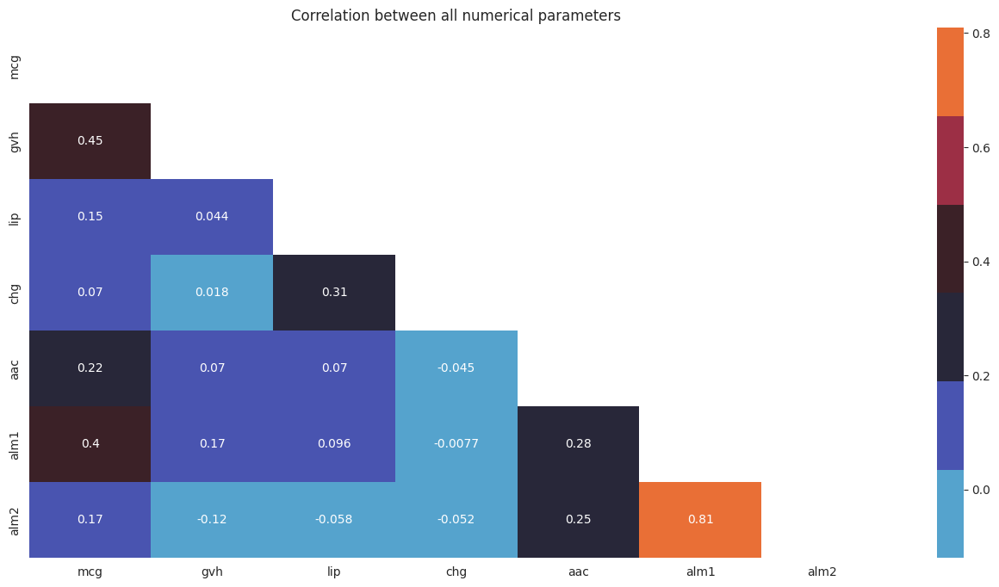

In [ ]:
plt.figure(figsize=(16, 8))
plt.title("Correlation between all numerical parameters")

mask = np.triu(np.ones_like(df_og[num_cols].corr()))

colourmap = sns.color_palette("icefire")

sns.heatmap(df_og[num_cols].corr(), annot=True, cmap=colourmap, mask=mask)

plt.show()

Plotting scatter matrix

array([[<Axes: xlabel='mcg', ylabel='mcg'>,
        <Axes: xlabel='gvh', ylabel='mcg'>,
        <Axes: xlabel='lip', ylabel='mcg'>,
        <Axes: xlabel='chg', ylabel='mcg'>,
        <Axes: xlabel='aac', ylabel='mcg'>,
        <Axes: xlabel='alm1', ylabel='mcg'>,
        <Axes: xlabel='alm2', ylabel='mcg'>],
       [<Axes: xlabel='mcg', ylabel='gvh'>,
        <Axes: xlabel='gvh', ylabel='gvh'>,
        <Axes: xlabel='lip', ylabel='gvh'>,
        <Axes: xlabel='chg', ylabel='gvh'>,
        <Axes: xlabel='aac', ylabel='gvh'>,
        <Axes: xlabel='alm1', ylabel='gvh'>,
        <Axes: xlabel='alm2', ylabel='gvh'>],
       [<Axes: xlabel='mcg', ylabel='lip'>,
        <Axes: xlabel='gvh', ylabel='lip'>,
        <Axes: xlabel='lip', ylabel='lip'>,
        <Axes: xlabel='chg', ylabel='lip'>,
        <Axes: xlabel='aac', ylabel='lip'>,
        <Axes: xlabel='alm1', ylabel='lip'>,
        <Axes: xlabel='alm2', ylabel='lip'>],
       [<Axes: xlabel='mcg', ylabel='chg'>,
        <Axes: xlabel='

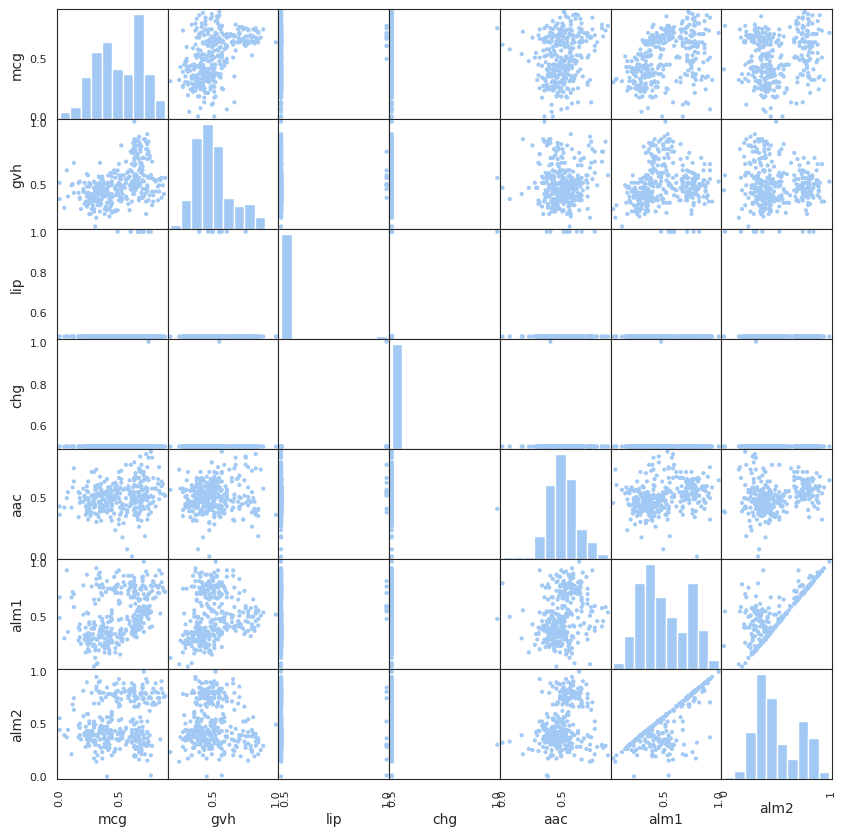

In [ ]:
pd.plotting.scatter_matrix(df_og[num_cols], figsize=(10, 10), grid=True, alpha=1, marker=".")

Plotting scatter diagrams

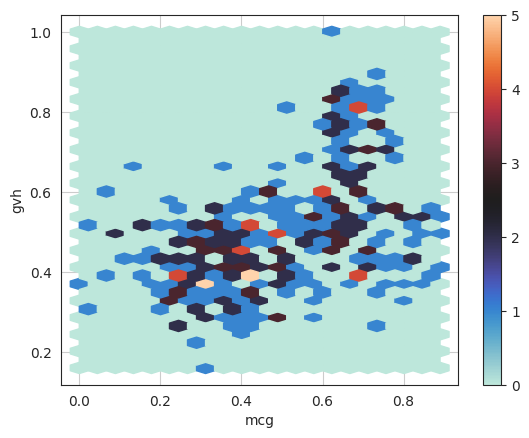

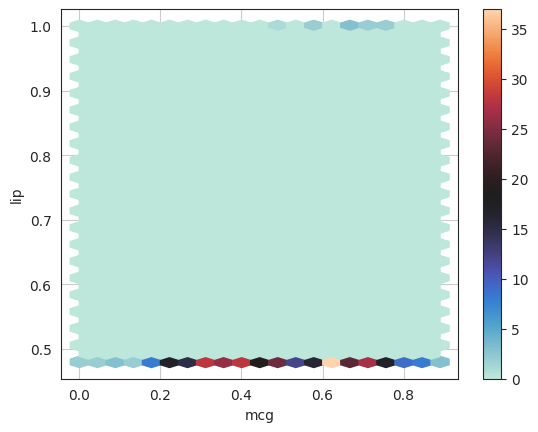

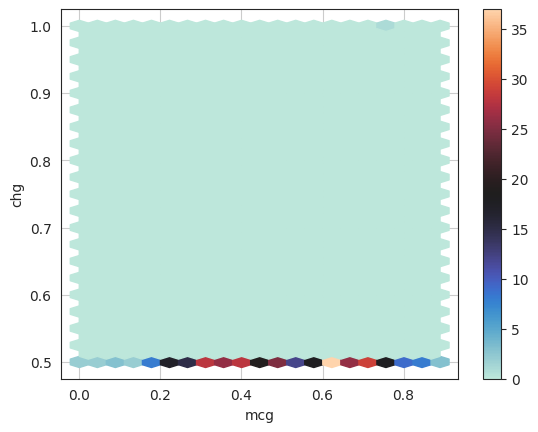

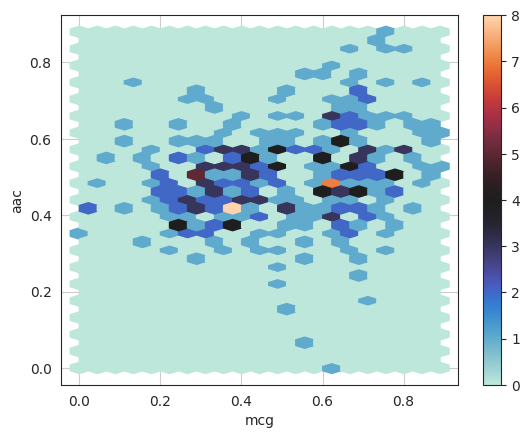

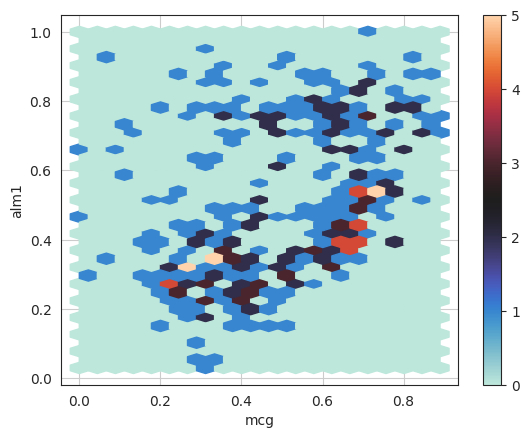

...

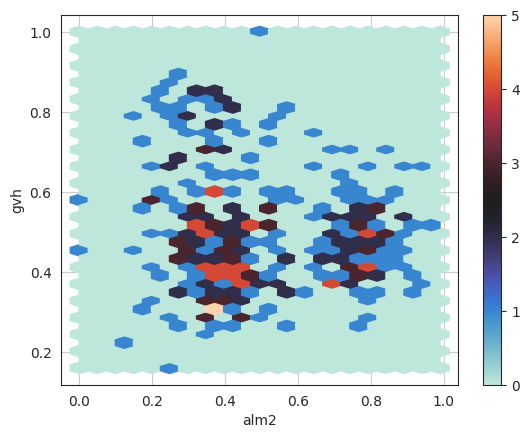

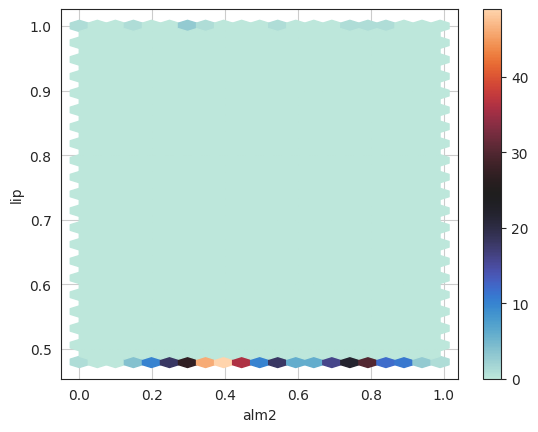

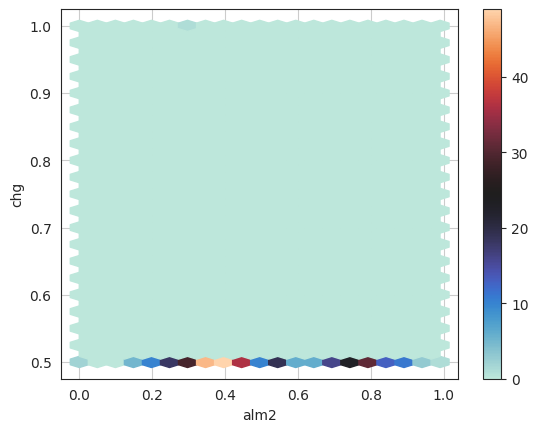

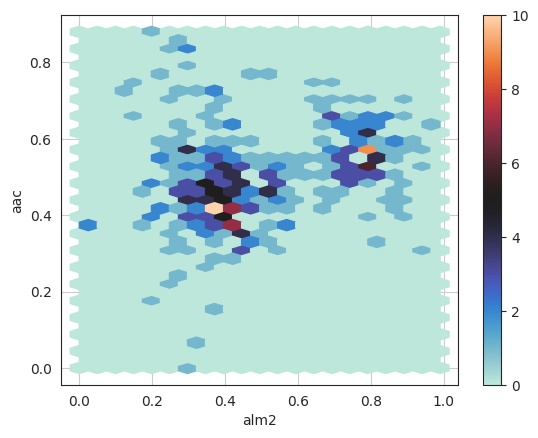

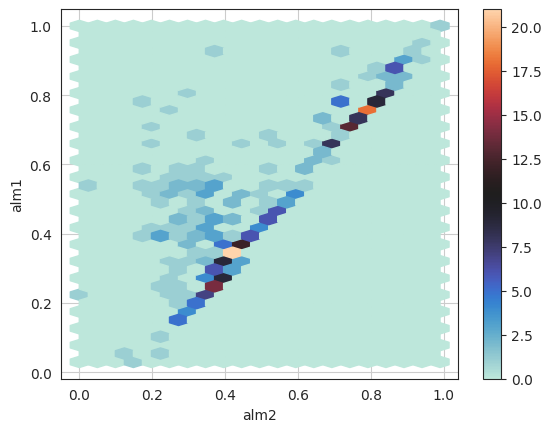

In [ ]:
for col1 in num_cols:
  for col2 in num_cols:
    if (col1 != col2):
      plt.hexbin(data=df_og[num_cols], x=col1, y=col2, gridsize=(20, 20), cmap="icefire")
      plt.colorbar()

      plt.xlabel(col1)
      plt.ylabel(col2)

      plt.grid()

      plt.show()

Plotting contour graphics

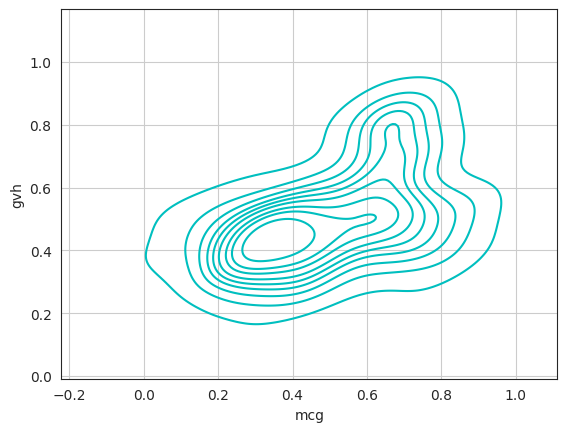

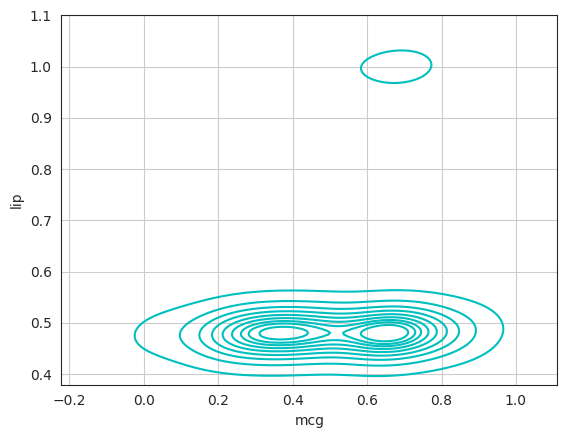

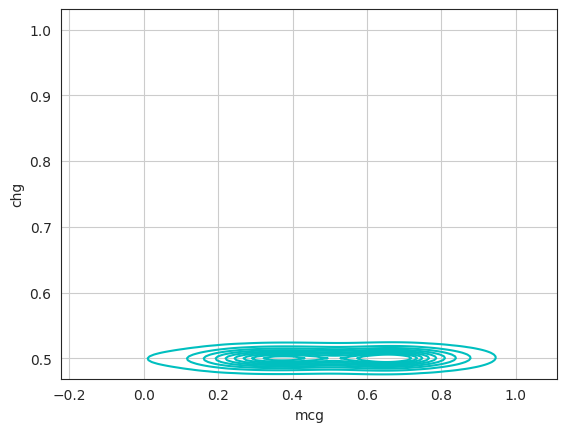

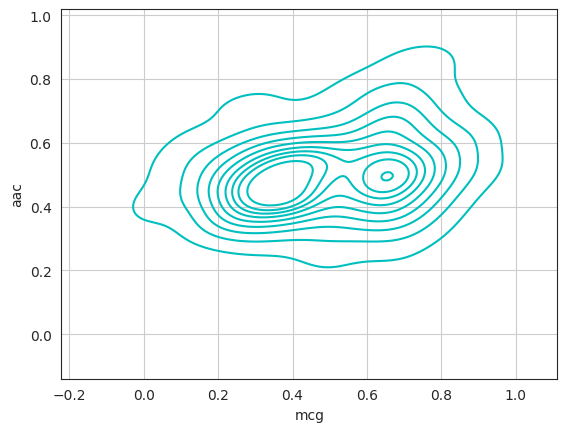

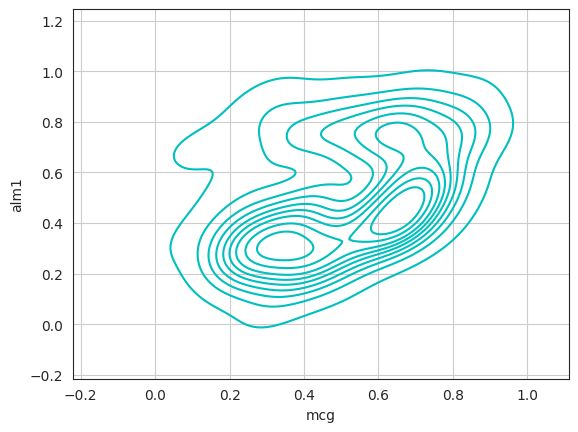

...

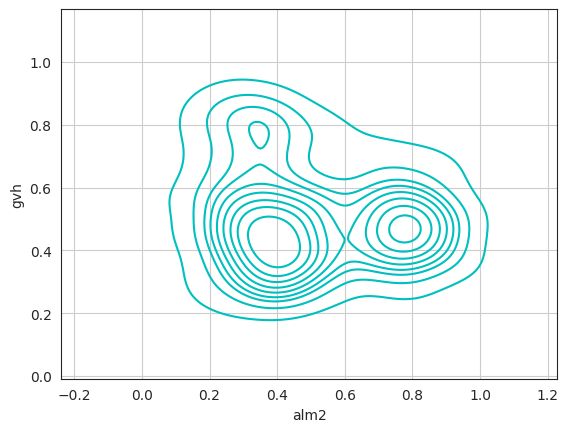

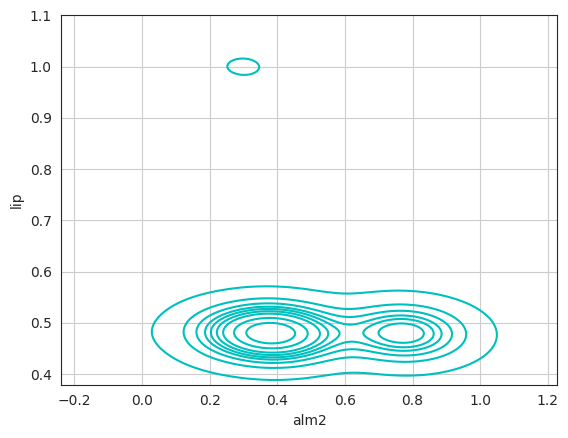

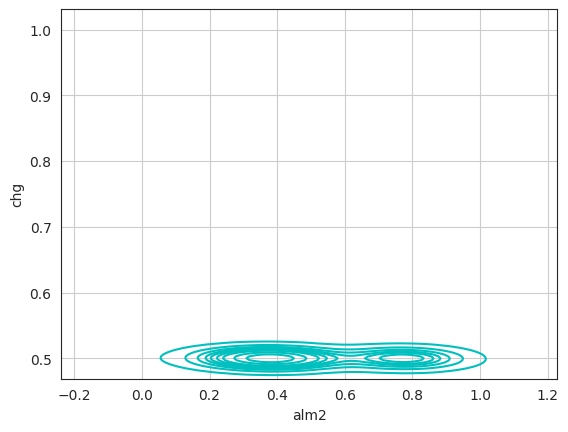

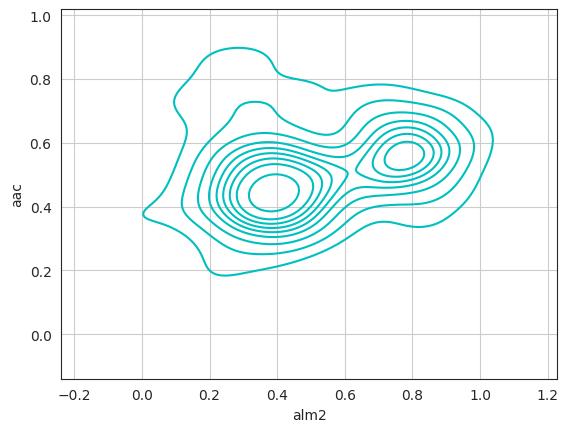

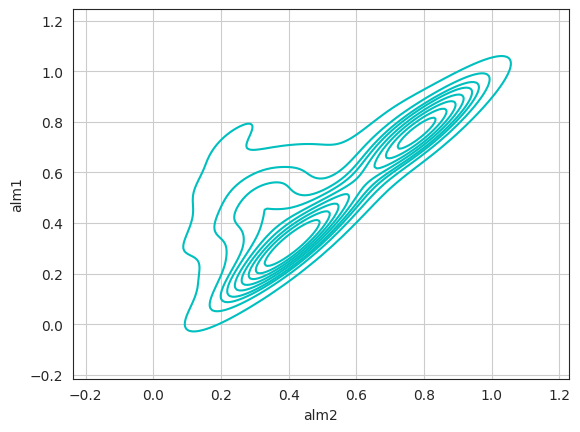

In [ ]:
for col1 in num_cols:
  for col2 in num_cols:
    if (col1 != col2):
      sns.set_style("white")

      sns.kdeplot(x=df_og[col1], y=df_og[col2], color="c")

      plt.xlabel(col1)
      plt.ylabel(col2)

      plt.grid()

      plt.show()

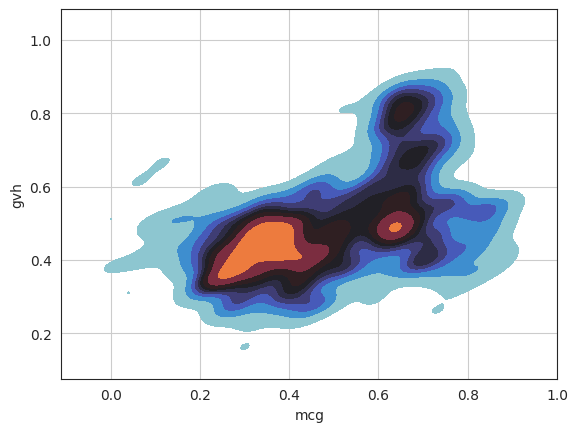

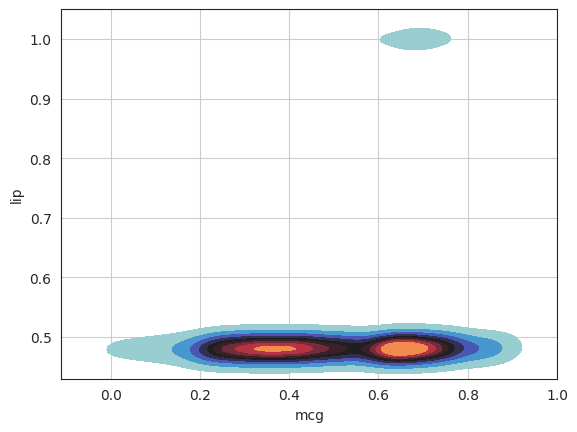

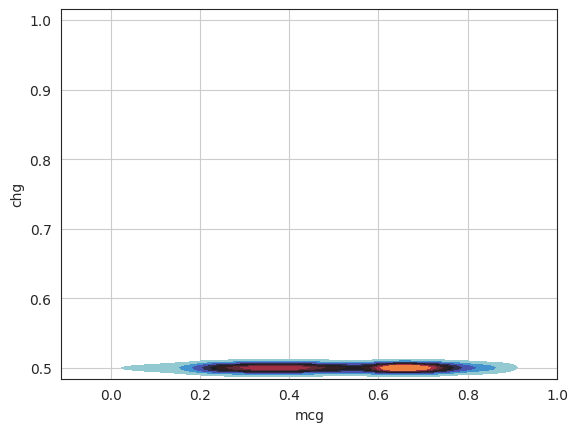

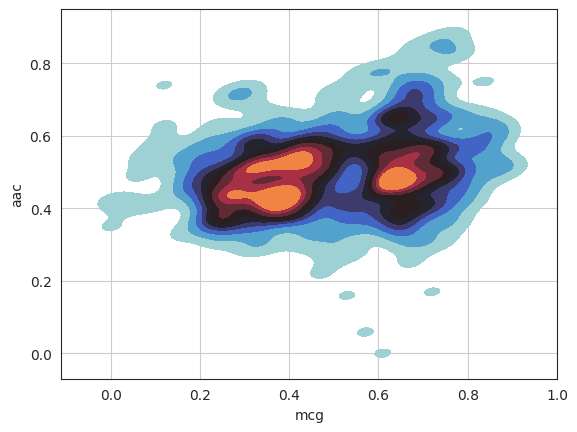

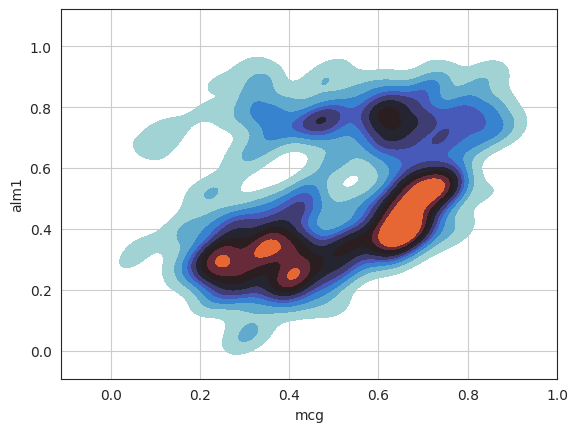

...

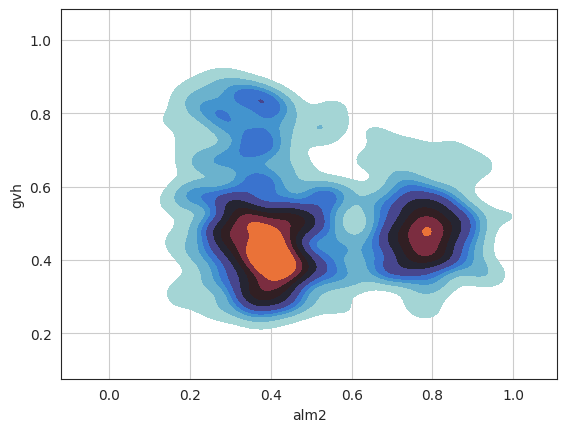

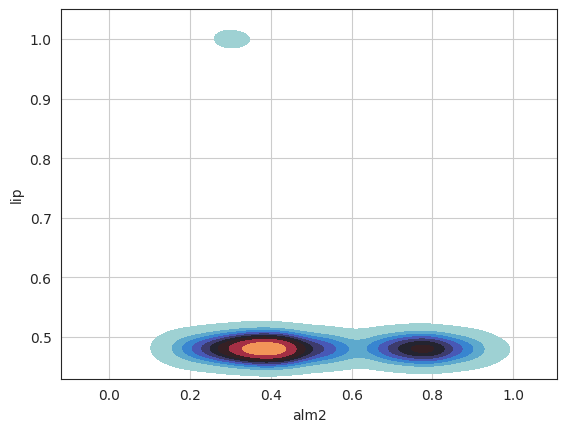

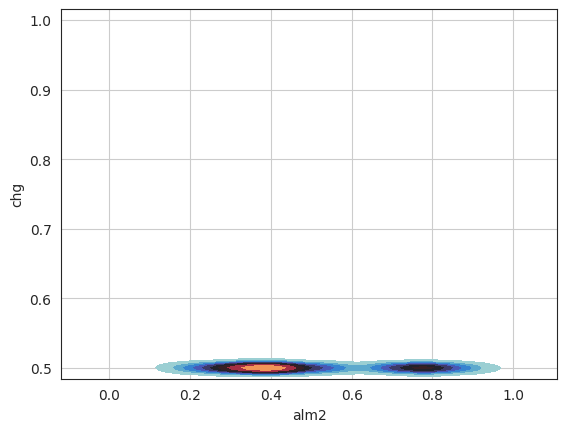

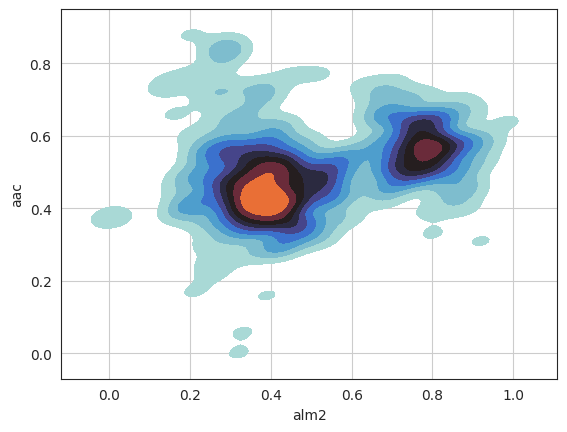

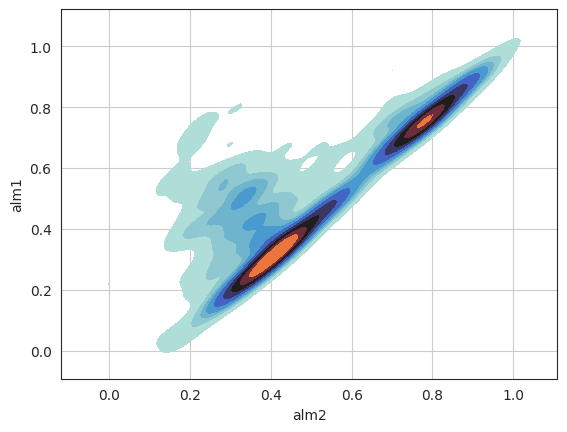

In [ ]:
for col1 in num_cols:
  for col2 in num_cols:
    if (col1 != col2):
      sns.set_style("white")

      sns.kdeplot(x=df_og[col1], y=df_og[col2], cmap="icefire", fill=True, bw_adjust=0.5, warn_singular=False)

      plt.xlabel(col1)
      plt.ylabel(col2)

      plt.grid()

      plt.show()

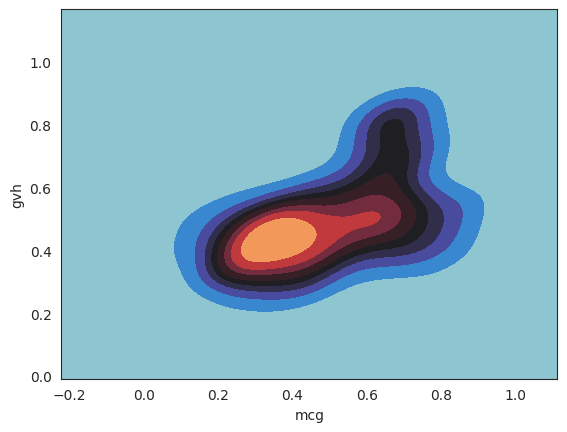

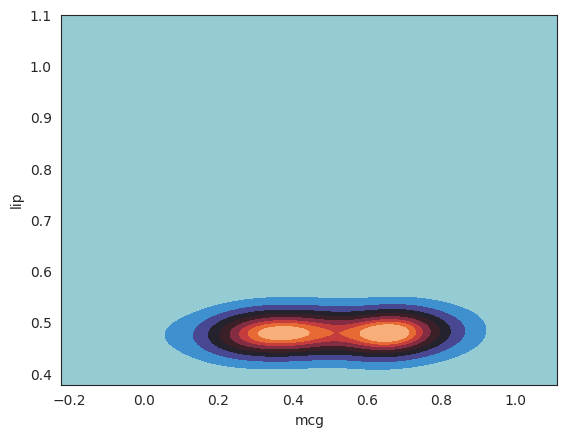

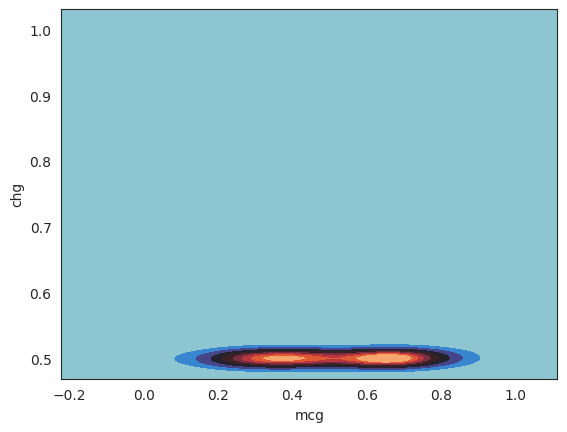

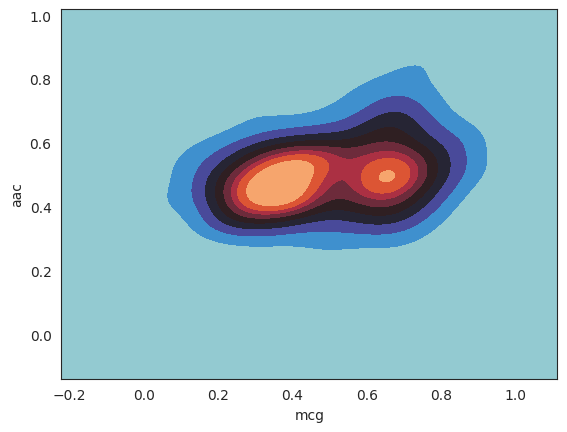

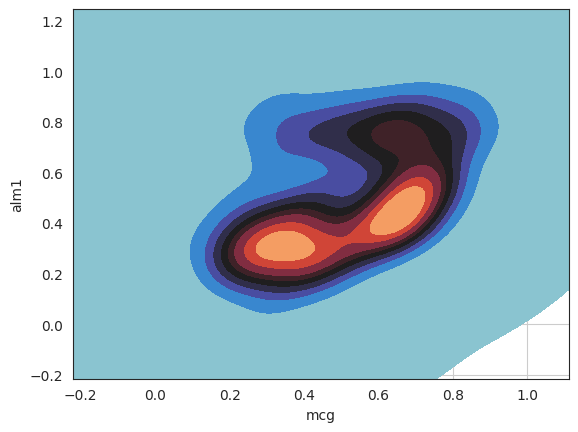

...

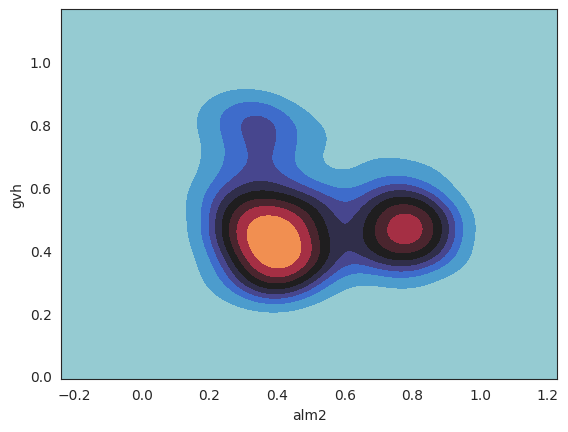

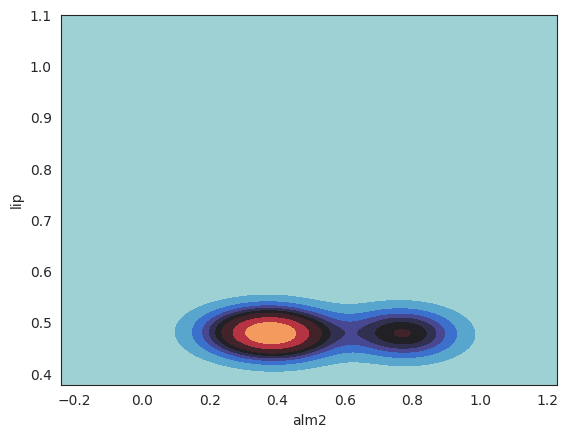

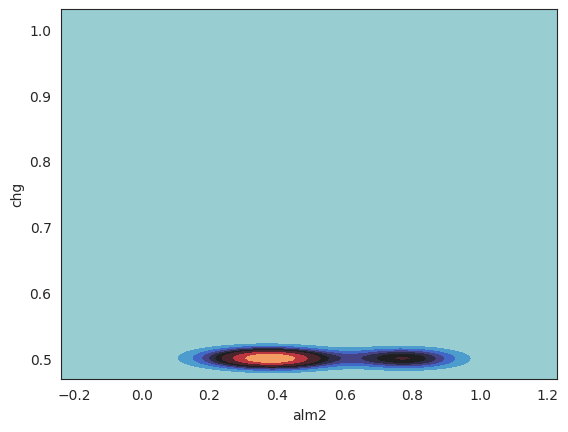

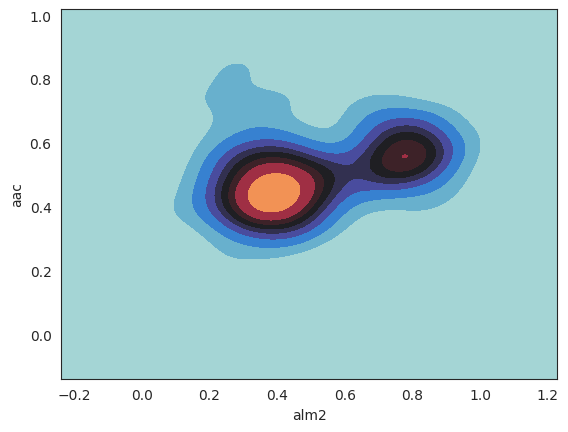

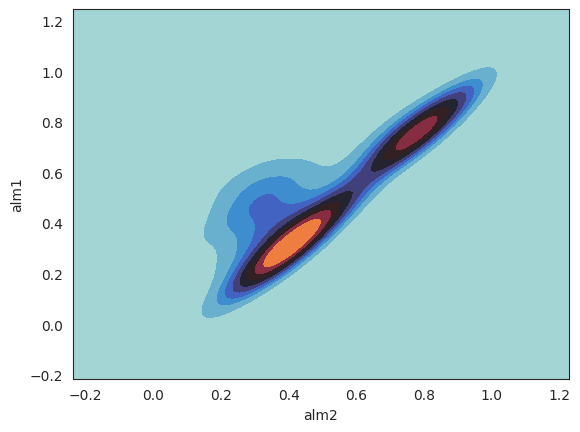

In [ ]:
for col1 in num_cols:
  for col2 in num_cols:
    if (col1 != col2):
      sns.set_style("white")

      sns.kdeplot(x=df_og[col1], y=df_og[col2], cmap="icefire", fill=True, thresh=0, warn_singular=False)

      plt.xlabel(col1)
      plt.ylabel(col2)

      plt.grid()

      plt.show()

Counting the correlation between numerical and categorical parameters

In [ ]:
df_og["class"].value_counts()

cp     143
im      77
pp      52
imU     35
om      20
omL      5
imS      2
imL      2
Name: class, dtype: int64

In [ ]:
le = LabelEncoder()
df_og["class"] = le.fit_transform(df_og["class"])

tg_num_corr = []
for col in num_cols:
  tg_num_corr.append(df_og[col].corr(df_og["class"]))

tg_num_df = pd.DataFrame({"Numerical parameters": num_cols, "Correlation with categorical parameters": tg_num_corr})
tg_num_df = tg_num_df.sort_values(by="Correlation with categorical parameters", key=abs, ascending=False).reset_index(drop=True)

tg_num_df

,Numerical parameters,Correlation with categorical parameters
0,gvh,0.670382
1,mcg,0.642656
2,alm1,0.218806
3,lip,0.149479
4,aac,0.121346
5,alm2,-0.108573
6,chg,-0.003017


Visualisation

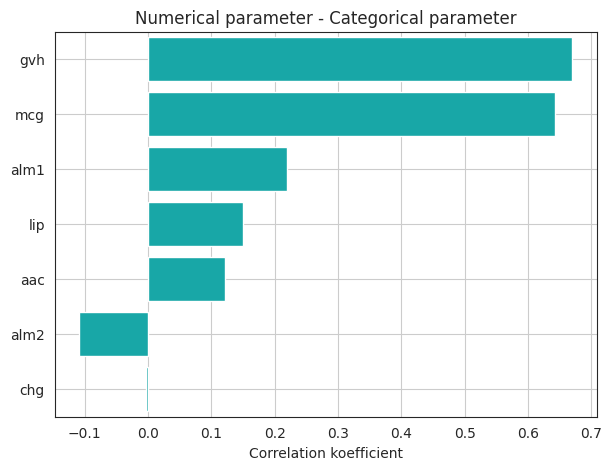

In [ ]:
plt.figure(figsize=(7, 5))
sns.barplot(x=tg_num_df["Correlation with categorical parameters"], y=tg_num_df["Numerical parameters"], color="c")

plt.ylabel("")
plt.xlabel("Correlation koefficient")
plt.title("Numerical parameter - Categorical parameter")
plt.grid()
plt.show()

Box diagrams

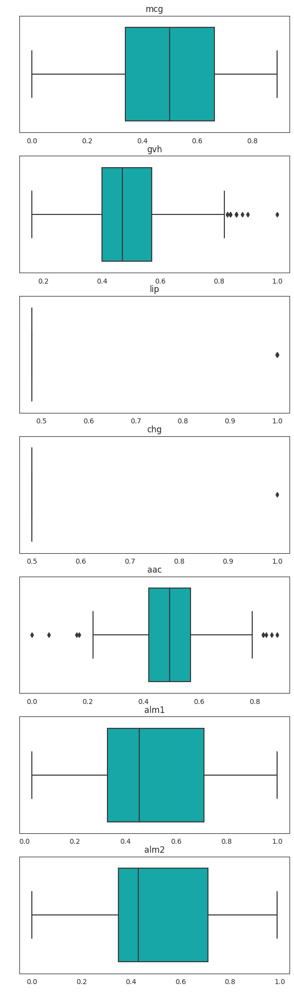

In [ ]:
fig, ax = plt.subplots(ncols=1, nrows=7, figsize=(7, 25))
i = 0

for col in num_cols:
  sns.boxplot(data=df_og[num_cols], x=col, ax=ax[i], color="c")
  ax[i].set_xlabel(" ")
  ax[i].set_ylabel(" ")
  ax[i].set_title(col)
  i += 1

plt.show()

Violin diagrams

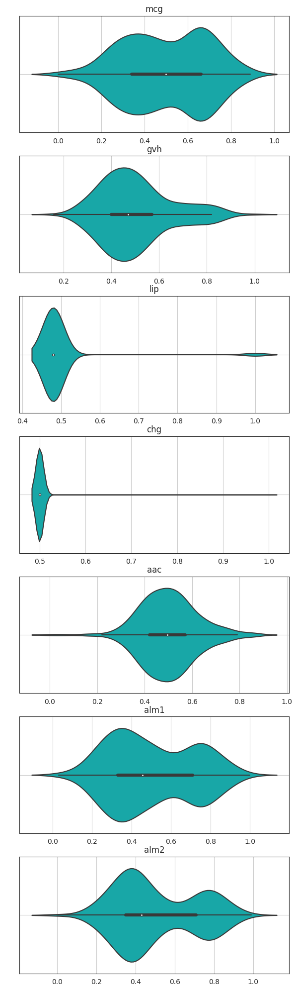

In [ ]:
fig, ax = plt.subplots(ncols=1, nrows=7, figsize=(7, 25))
i = 0

for col in num_cols:
  sns.violinplot(data=df_og[num_cols], x=col, ax=ax[i], color="c")
  ax[i].set_xlabel(" ")
  ax[i].set_ylabel(" ")
  ax[i].set_title(col)
  ax[i].grid()
  i += 1

plt.show()

Searching for outliers for each parameter using Inner Fence

In [ ]:
outlier_dict = {}
outlier_dict_unique = {}

for col in num_cols:
  stats = df_og[col].describe()
  q1, q3 = stats["25%"], stats["75%"]

  iqr = q3 - q1

  lower_bound = q1 - (1.5 * iqr)
  upper_bound = q3 + (1.5 * iqr)

  outlier_list = []
  outlier_list_unique = []

  for x in df_og[col]:
    if ((x > upper_bound) or (x < lower_bound)):
      outlier_list.append(x)

      if x not in outlier_list_unique:
        outlier_list_unique.append(x)

    outlier_dict["{}".format(col)] = outlier_list
    outlier_dict_unique["{}".format(col)] = outlier_list_unique

Outliers for each parameter

In [ ]:
for x, y in outlier_dict.items():
  print(x, "Outliers (Inner Fence):")
  print(*y)
  print("Amount:", len(y))
  print("====================\n")

mcg Outliers (Inner Fence):

Amount: 0

gvh Outliers (Inner Fence):
0.88 0.84 0.9 0.84 0.86 0.86 1.0 0.86 0.83 0.86 0.84 0.84 0.83
Amount: 13

lip Outliers (Inner Fence):
1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0
Amount: 10

chg Outliers (Inner Fence):
1.0
Amount: 1

aac Outliers (Inner Fence):
0.16 0.0 0.06 0.83 0.86 0.83 0.88 0.84 0.17
Amount: 9

alm1 Outliers (Inner Fence):

Amount: 0

alm2 Outliers (Inner Fence):

Amount: 0



Unique outliers for each parameter

In [ ]:
for x, y in outlier_dict_unique.items():
  print(x, "Unique (Inner Fence):")
  print(*y)
  print("Amount:", len(y))
  print("====================\n")

mcg Unique (Inner Fence):

Amount: 0

gvh Unique (Inner Fence):
0.88 0.84 0.9 0.86 1.0 0.83
Amount: 6

lip Unique (Inner Fence):
1.0
Amount: 1

chg Unique (Inner Fence):
1.0
Amount: 1

aac Unique (Inner Fence):
0.16 0.0 0.06 0.83 0.86 0.88 0.84 0.17
Amount: 8

alm1 Unique (Inner Fence):

Amount: 0

alm2 Unique (Inner Fence):

Amount: 0



Creating dataframe with data about outliers

In [ ]:
outlier_list_count = []
outlier_list_unique_count = []

for x, y in outlier_dict.items():
  outlier_list_count.append(len(y))

for x, y in outlier_dict_unique.items():
  outlier_list_unique_count.append(len(y))

outlier_df = pd.DataFrame({"Parameter": num_cols, "Amount of outliers": outlier_list_count, "Amount of unique outliers": outlier_list_unique_count})

outlier_df

,Parameter,Amount of outliers,Amount of unique outliers
0,mcg,0,0
1,gvh,13,6
2,lip,10,1
3,chg,1,1
4,aac,9,8
5,alm1,0,0
6,alm2,0,0


Deleting outliers based on IQR with the usage of Inner Fence

In [ ]:
after_removal = df_og[num_cols]

for col in num_cols:
  stats = df_og[col].describe()

  q1, q3 = stats["25%"], stats["75%"]

  iqr = q3 - q1

  lower_bound = q1 - (1.5 * iqr)
  upper_bound = q3 + (1.5 * iqr)

  after_removal = after_removal[(after_removal[col] >= lower_bound) & (after_removal[col] <= upper_bound)]

In [ ]:
removed = 100 * (df_og[num_cols].shape[0] - after_removal.shape[0]) / df_og[num_cols].shape[0]
print("Percentage of deleted raws: {}%".format(round(removed, 2)))

Percentage of deleted raws: 8.93%
